# A Painterly Approach: The (In-?)Significance of Color in Deep-Learning Image Classification

Among data scientists and other data enthusiasts, it might be found off that I have spent my first endeavor into deep learning upon a topic that some might see as simply as as a personal interest: Painting. While this is certainly true, as learning of and exploring the many styles of painting across cultures and centuries is something I find great enjoyment in, I certainly don't believe that applying deep learning upon painting is something that's only memorable for a novelty testing group. In fact, I believe that using paintings in deep learning could possibly tell us an extraordinary amount about how deep learning functions (Keras in this case) and what it might prioritize in image recognition, which may not be possible simply through using photos. 

What differs painting style recognition from photo subject recognition is that in painting style recogntion, the primary and essential clue towards determining style lies within the brush stroke, an aspect not present in photos. The brush stroke is the large majority of what determines a style, and this is due to brush strokes greatly differing in width of the brush, pressure applied to the brush during the stroke, how long the strokes are, and then the many, many different techniques that come from virtually countless combinations of those aspects listed and unlisted. 

This then begs the question, "What of color?" Color is the most important factor in setting the mood of a painting and can drastically change how it's interpreted. Color is what allows a painting to feel like a properly dreary, foggy night in England, or a bright, lucid morning upon a coast, or a bombastic, flamboyant collage of crowds and architecture either in commotion or in ecstasy. Seeing as certain styles do largely prefer certain moods, such styles thus prefer certain palettes, but this is not without overlap among them. In particular, European styles of the past 300 years, despite notable differences in painting techniques, have many overlapping color preferences that make up earthen, gloomy, and pastel tones, such that color palettes are often not the best signifier of which style of those lands and eras a painting may be. This then brings us back to seeing brush strokes and technique as what's most important in determining a style. 

Yet, does an algorithm agree? With machine learning and visual arts as two of the primary members in the forefront of my passions, I intend to merge the two in an endeavor to determine the degree of importance of color in deep learning image recognition. As noted, color in painting greatly influences the mood interpreted by the viewer, which is intended to be a human. But, what if the viewer is a carefully constructed algorithm? Human interpretation of mood in a painting is inherently rooted in an involuntary emotional response, albeit often quite subtle. Unless an algorithm is trained to determine mood, mood is an entirely alien variable. This then leads me to question just how important color is to an algorithm when built to determine which of two styles a painting might be. Is color a confounding factor that may throw a wrench in things, especially since so many styles overlap in palette? Since there is this overlap, is color then negligible, and will thus have no effect in the algorithm's efficiency? If color is confounding or negligible, should the algorithm then be trained and tested on grayscale images instead, in which it's given a single color array as opposed to three arrays corresponding to red, green, and blue? If we use grayscale, are we not then reducing usable data by a factor of three? These questions could go on, and on, and on, with endless philosophizing about the possible tradeoffs between using grayscale and color images. While doing so certainly brings many ideas and motivation to mind, it still doesn't bring answers, so I now intend to find them after hours of pondering this topic myself.

# Investigation Methodology

For this investigation into the significance of color in Keras deep-learning algorithms, I'll be treating my methodolgy as that of a science experiment to make sure that I can come to a sound, valid, and reproducible conclusion with meaningful insights. As such, it's necessary that I make sure that the samples I work with are controlled in such a way that there are no confounding factors such that I'm truly able to focus in on the importance of color. To go about doing this, I've decided to break up the brunt of my work into three different tests. For all of these tests, I will be using the exact same custom-made Keras model. In each test, the Keras model will be trained first on grayscale versions of paintings within a sample, then tested for accuracy by being run on 75 rounds of 400 test samples. The 75 accuracy measurements will then be saved as an array. All of this will then be done in the same way for the same sample paintings, but in RGB. The difference between these three tests lies in the styles and genres of the training and test samples, which are as follow:

1. Two styles, same genre.
2. Same style, two genres.
3. Two styles, all genres.

After each test, I will visualize accuracy results, create statistics for each grayscale/RGB model, and then compare and explore the differences between the two in pursuit of how significant color was in those results.

In [289]:
import pandas as pd
import numpy as np
import tensorflow.keras as keras
from keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, MaxPooling2D, Dropout
from keras.optimizers import SGD, adam
from keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import cv2
import gc
import boto3
import io
import time
from PIL import Image
from numpy import expand_dims
from sklearn.metrics import classification_report, confusion_matrix
from scipy.stats import ttest_ind

# Data Exploration and Processing

The dataset that I'll be using for this project is from a Kaggle competition titled "Painter by Numbers", in which Kagglers are being challenged to "examine pairs of paintings and determine if they are by the same artist" through the use of computer vision. It then carries on to mention "From the movement of brushstrokes to the use of light and dark, successful algorithms will likely incorporate many aspects of a painter's unique style," which is just what we happen to be investigating as well. However, we'll be handling such a topic from a broader perspective of genres as opposed to specific artists.

https://www.kaggle.com/c/painter-by-numbers/data

Below is the given CSV holding all the data regarding the artist, year mad, genre, style, and title of the paintings within the dataset, while also giving data relevant to the file of the painting itself such as its dimensions, file size, and filename, and then an 'in_train' column regarding if a painting is in the training set or not for the competition. In our case, we'll only be worrying about the genre, style, in_train, and filename columns. Additionally, there are two relevant rars for this project from the competition titled 'train' and 'test' which hold all of the painting files for the train and test sets. They are both unpacked in their own respective folders in an S3 bucket, and will be pulled from there when needed as opposed to having all 47 gigabytes of data loaded in this Jupyter instance, much of which we wouldn't be using anyways.

In [14]:
all_info = pd.read_csv('s3://paintings4ml/all_data_info.csv')

all_info.head(10)

,artist,date,genre,pixelsx,pixelsy,size_bytes,source,style,title,artist_group,in_train,new_filename
0,Barnett Newman,1955.0,abstract,15530.0,6911.0,9201912.0,wikiart,Color Field Painting,Uriel,train_only,True,102257.jpg
1,Barnett Newman,1950.0,abstract,14559.0,6866.0,8867532.0,wikiart,Color Field Painting,Vir Heroicus Sublimis,train_only,True,75232.jpg
2,kiri nichol,2013.0,NaN,9003.0,9004.0,1756681.0,NaN,Neoplasticism,NaN,test_only,False,32145.jpg
3,kiri nichol,2013.0,NaN,9003.0,9004.0,1942046.0,NaN,Neoplasticism,NaN,test_only,False,20304.jpg
4,kiri nichol,2013.0,NaN,9003.0,9004.0,1526212.0,NaN,Neoplasticism,NaN,test_only,False,836.jpg
5,Tosa Mitsuoki,NaN,mythological painting,25528.0,3000.0,10496349.0,wikiart,Yamato-e,Night March of a Hundred Demons (left half),train_only,True,29855.jpg
6,Barnett Newman,NaN,abstract,7345.0,8640.0,6383948.0,wikiart,Color Field Painting,"Who’s Afraid of Red, Yellow and Blue II",train_only,True,62252.jpg
7,Hiroshige,1838,bird-and-flower painting,6483.0,9276.0,12762418.0,wikiart,Ukiyo-e,Small Bird on a Branch of Kaidozakura,train_and_test,False,49823.jpg
8,Barnett Newman,1963.0,abstract,6049.0,8206.0,1135960.0,wikiart,Color Field Painting,Black Fire I,train_only,True,63861.jpg
9,Franz Richard Unterberger,NaN,cityscape,6238.0,7352.0,7896792.0,wikiart,Romanticism,Procession in Naples,train_and_test,False,84512.jpg


We can now see the top styles in our dataset, all of which have been very popular throughout Western art throughout the past few hundred years at varying degrees. For the sake of consistency in this project, I'll be using Realism and Expressionism. I've chosen them not only because they have so many paintings present in our dataset, but because they have notably different techniques employed that cause them to stand out from each other, while also having their common color palettes partially overlap, but not entirely. 

In [15]:
topwant = all_info['style'].value_counts()[:10]
topstyle = ['Realism', 'Expressionism']
topwant

Impressionism           10643
Realism                 10523
Romanticism              9285
Expressionism            7013
Post-Impressionism       5778
Art Nouveau (Modern)     4899
Baroque                  4400
Surrealism               4167
Symbolism                3476
Rococo                   2733
Name: style, dtype: int64

Since the first test is focused on paintings of two different styles but of the same genre, it's now important to see what genre is prominent among both Realism and Expressionism. I've decided to work with portraits, particularly since portraits have a very common composition, which is a person in the center of the painting, usually facing the viewer. This allows more control over the consistency of what's important to the project in our sample paintings, thus allowing the model to focus less on factors such as composition and more on factors such as painting techniques and color.

In [16]:
all_info[all_info['style'] == 'Realism']['genre'].value_counts()[:10]

landscape           2843
portrait            2460
genre painting      1741
sketch and study     947
cityscape            401
flower painting      385
still life           320
illustration         169
animal painting      169
self-portrait        153
Name: genre, dtype: int64

In [17]:
all_info[all_info['style'] == 'Expressionism']['genre'].value_counts()[:10]

portrait              1727
genre painting        1314
landscape              748
nude painting (nu)     557
cityscape              392
still life             350
self-portrait          327
sketch and study       241
figurative             231
animal painting        135
Name: genre, dtype: int64

# Test 1: Portraits of Realism vs Expressionism
## 1. Grayscale 

Now that the styles and genre are chosen, I can begin creating the testing and training samples.

The first thing I've done is created a temporary dataset that's comprised only of portrait paintings that are either Realist or Expressionist, while also being labeled as 'train'. What I then do is take the value counts of these two styles, and take the smaller of the two values. I do this so that way, I can have an equal amount of each of the styles in the training set in which the among of each is equal to the smaller of the two value counts. This allows for the model to train evenly on each style without becoming more familiar with one over the other, which would cause bias in our accuracy tests.

After creating two temporary datasets of the same size of each style for portrait paintings, I concatenate them for the training info dataset. For the test info dataset, I take all available portrait paintings of the two genres labeled as 'test'.

In [384]:
temp = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'].isin(topstyle) == True) & 
                     (all_info['genre'] == 'portrait')].copy().reset_index(drop = True)

amount = temp['style'].value_counts()[1]

real = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Realism') & 
                     (all_info['genre'] == 'portrait')].head(amount)

exp = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Expressionism') & 
                     (all_info['genre'] == 'portrait')].head(amount)

train_info = pd.concat([real, exp]).sample(frac=1).reset_index(drop=True)

test_info = all_info[(all_info['in_train'] == False) & 
                 (all_info['style'].isin(topstyle) == True) &
                    (all_info['genre'] == 'portrait')].copy().reset_index(drop = True)

print('Train Shape: ', train_info.shape)
print('Test Shape: ', test_info.shape)

Train Shape:  (2660, 12)
Test Shape:  (983, 12)


With the info datasets, I then create two lists of all the painting filepaths by taking the filenames from each dataset and formatting them to have a full path name.

In [385]:
train_names = train_info.new_filename.values
test_names = test_info.new_filename.values

train_get = ['train/{}'.format(i) for i in train_names]
test_get = ['test/{}'.format(i) for i in test_names]

In [386]:
print(train_info.shape[0] == len(train_get))
print(test_info.shape[0] == len(test_get))

True
True


With the filepaths, some samples of Realism (top row) and Expressionism (bottom row) can now be displayed, as they are below. To give elaboration on what defines these styles and their origins, here are some collected definitions:

"The term realism was coined by the French novelist Champfleury in the 1840s and in art was exemplified in the work of his friend the painter Gustav Courbet. In practice realist subject matter meant scenes of peasant and working class life, the life of the city streets, cafes and popular entertainments, and an increasing frankness in the treatment of the body and sexual subjects. The term generally implies a certain grittiness in choice of subject. Such subject matter combined with the new naturalism of treatment caused shock among the predominantly upper and middle class audiences for art."
- https://www.tate.org.uk/art/art-terms/r/realism

"In expressionist art, colour in particular can be highly intense and non-naturalistic, brushwork is typically free and paint application tends to be generous and highly textured. Expressionist art tends to be emotional and sometimes mystical. It can be seen as an extension of Romanticism.

Although the term expressionist can be applied to artworks from any era, it is generally applied to art of the twentieth century."
- https://www.tate.org.uk/art/art-terms/e/expressionism

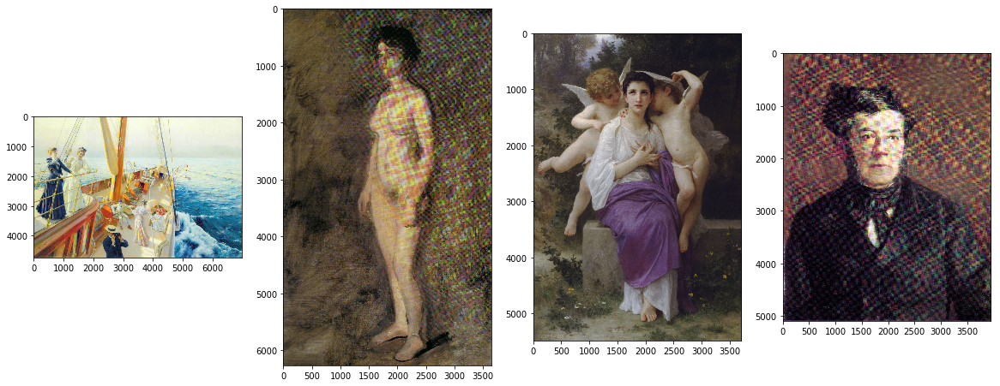

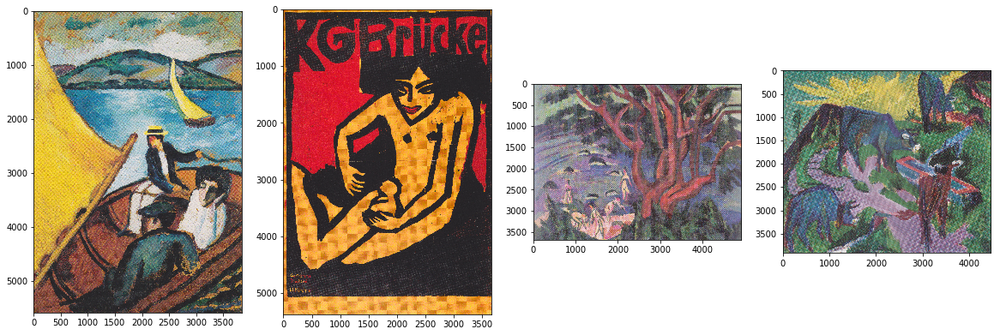

In [257]:
s3 = boto3.resource('s3', region_name='us-east-1')
bucket = s3.Bucket('paintings4ml')

real_names = real.new_filename.values[:4]
exp_names = exp.new_filename.values[:4]

real_get = ['train/{}'.format(i) for i in real_names]
exp_get = ['train/{}'.format(i) for i in exp_names]

plt.figure(figsize = (20, 10))

n = 1
for ima in real_get:
    plt.subplot(1, 4, n)
    
    object = bucket.Object(ima)
    file_stream = io.BytesIO()
    object.download_fileobj(file_stream)
    
    img = mpimg.imread(file_stream, 0)
    imgplot = plt.imshow(img)
    n += 1
plt.show()

plt.figure(figsize = (20, 10))
n = 1
for ima in exp_get:
    plt.subplot(1, 4, n)
    
    object = bucket.Object(ima)
    file_stream = io.BytesIO()
    object.download_fileobj(file_stream)
    
    img = mpimg.imread(file_stream, 0)
    imgplot = plt.imshow(img)
    n += 1
plt.show()

With all the necessary filepaths, the painting files can now all be processed as number arrays to be fed into the model. Yet, to do so, they all must be resized, and how many layers they have depends on if we want the paintings to be grayscale or RGB, which will have 1 or 3 layers respectively. Thus, I've made a handy function that takes a list of image filepaths and the wanted amount of layers, and then returns all a list comprised of all the paintings as arrays of the desired dimensions.

Additionally, one might notice the try/except statement in both parts of the if/else statement. This is due to some files not properly converting their colors and changing to the wanted dimensions properly, which causes issues for the model, and thus are returned as '0' if this happens to be the case. Doing this means that the image and its class label can then be easily removed from their respective lists later on. Because this is the case for so few images (roughly 2 or 3 per 1000 images), this is not a major issue, so little data is being lost. 

In [25]:
maxdim = 240

def proc_img(list_of_img, dim):
    Image.MAX_IMAGE_PIXELS = None
    X = []
    for image in list_of_img:
        object = bucket.Object(image)
        file_stream = io.BytesIO()
        object.download_fileobj(file_stream)

        img = mpimg.imread(file_stream, 0)

        img = cv2.resize(img, (maxdim, maxdim), dim)
        
        if dim == 1:
            try:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            except:
                img = 0
                
        else:
            try:
                img = img
            except:
                img = 0
            
        X.append(img)
        
    return X

In [387]:
start = time.time()

X_train_check = proc_img(train_get, 1)
X_test_check = proc_img(test_get, 1)

end = time.time()
print(end - start)

/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:763: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:763: UserWarning: Possibly corrupt EXIF data.  Expecting to read 787528 bytes but only got 5533. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:763: UserWarning: Possibly corrupt EXIF data.  Expecting to read 7281180688 bytes but only got 0. Skipping tag 8
  " Skipping tag %s" % (size, len(data), tag))


485.91066575050354


Just to test that the files were processed correctly, I've printed some of the paintings to make sure they're entirely in grayscale. 

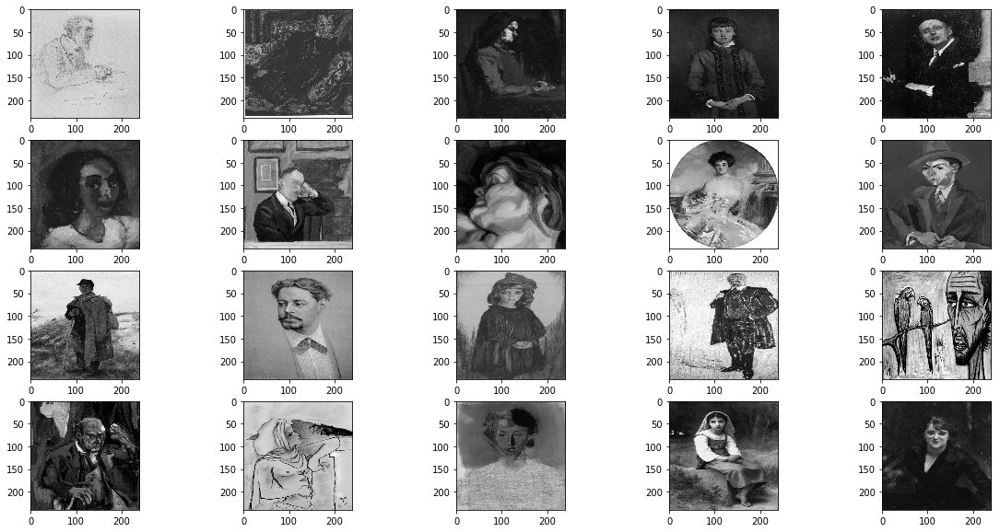

In [27]:
plt.figure(figsize = (20, 10))

n = 1
for ima in X_train_check[:20]:
    plt.subplot(4, 5, n)
    imgplot = plt.imshow(ima, cmap="gray", vmin=0, vmax=255)
    n += 1
plt.show()

Now that the X variables are created, it's time to make the Y variables.

What I do here is take the style columns from our info datasets and then turn them into a list of numbers based on the given style. Here, the case is that Realism is turned into a 1 and Expressionism, a 2. 

Then, since the model's loss calculation will be working off of binary cross-entropy, the input y-value for each X-value will need to be of the form of an array with binary values such that there is a single 1 and the rest of the indices are 0s. This form indicates that the X-value is of the class that the 1's index matches to. For the y-values to have that format, I've made a function that translates the 1s and 2s below into the desired formatting for binary cross-entropy.

In [388]:
y_train = train_info['style'].copy()
y_train = y_train.replace({'Realism' : 1, 
                 'Expressionism' : 2})

y_test = test_info['style'].copy()
y_test = y_test.replace({'Realism' : 1, 
                 'Expressionism' : 2})

print(train_info.shape[0] == len(y_train))
print(test_info.shape[0] == len(y_test))

True
True


In [29]:
def get_val_array(val):
    
    val_arrays = []
    
    for i in list(val.values):
        temp = [0] * len(set(val))
        temp[int(i) - 1] = 1
        val_arrays.append(temp)

    val_arrays = np.array(val_arrays)

    return val_arrays

In [389]:
y_train_check = get_val_array(y_train)
y_test_check = get_val_array(y_test)

I mentioned for the proc_img function that some images wouldn't resize correctly, and thus were replaced with a '0' in the lists as opposed to their actual values. This is where those values will be removed since they're of no use to us.

What happens first is that I make a list of indices where values in our X list are '0' using the enumerate function. I then do this as well for both the X and Y lists, but instead check if a values index isn't in the index list, meaning that its value isn't '0'. By checking the indices, this allows me to both remove the '0' from the X list, but also its respective class value from the Y list.

In [390]:
index = [i for i, x in enumerate(X_train_check) if (x is 0)]
X_train = [expand_dims(x, axis=2) for i,x in enumerate(X_train_check) if i not in index]
y_train = [x for i,x in enumerate(list(y_train_check[:2750])) if i not in index]

print(len(X_train), len(y_train))

2647 2647


In [391]:
index = [i for i, x in enumerate(X_test_check) if (x is 0)]
X_test = [expand_dims(x, axis=2) for i,x in enumerate(X_test_check) if i not in index]
y_test = [x for i,x in enumerate(list(y_test_check[:2000])) if i not in index]

print(len(X_test), len(y_test))

977 977


Now that our X and Y sets are entirely made, the data generators for the models can be created. These generators allow us to create batches of tensor image data with real-time data augementation that allows images to be reused across batches, but altered to certain degrees and in various ways so that the model can learn about different aspects of classes from different representations, such that it's not just training on the same data over and over.

In [392]:
#BATCH_SIZE = 500
#rescale=1./255

train_datagen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range = 0, 
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  shear_range = 0.1 ,
                                  zoom_range = 0.1,
                                  horizontal_flip = False)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_re_ex_po_gray = train_datagen.flow(np.array(X_train[:2600]), 
                                     np.array(y_train[:2600]), 
                                     batch_size = 325)
test_gen_re_ex_po_gray = test_datagen.flow(np.array(X_test)[:800], 
                                   np.array(y_test)[:800], 
                                   batch_size = 400, 
                                  shuffle = True)

The following two cells contain our model. Everything here has been meticuously tested, debugged, and altered over the course of six weeks of on-and-off experimentation and prowling StackOverflow to create the best results possible for this project. This model will be the exact same for each test, with the only values ever changing being the third value in the first Conv2D's input_shape, the steps_per_epoch, and the validation_steps switching between 1 and 3 for grayscale and RGB respectively since these values are tied directly to the amount of layers in the image data.

And now with that said, the first test can begin. Results will be analyzed once both the grayscale and RGB results are collected.

In [393]:
n = 3

model_re_ex_po_gray = keras.models.Sequential([
    keras.layers.Conv2D(2**n, (5,5), activation='relu', input_shape=(maxdim, maxdim, 1)),
    keras.layers.Conv2D(2**(n), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    keras.layers.Dense(2**(n), activation='relu'),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+1), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+1), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+2), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+2), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.2),

    keras.layers.Flatten(),
    keras.layers.Dense(2**(n+3), activation='relu'),
    keras.layers.Dense(2, activation = 'sigmoid')
])

In [394]:
learning_rate=0.04
momentum = 0.15

opt = keras.optimizers.SGD(learning_rate = learning_rate, momentum = momentum)

model_re_ex_po_gray.compile(optimizer = opt,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

start = time.time()
history_re_ex_po_gray = model_re_ex_po_gray.fit_generator(train_gen_re_ex_po_gray, 
                              steps_per_epoch = 1,
                              epochs = 128, 
                             validation_data = test_gen_re_ex_po_gray,
                             validation_steps = 1)
end = time.time()
time_re_ex_po_gray = end - start

Epoch 1/128
Epoch 1/128
1/1 [==============================] - 9s 9s/step - loss: 0.6946 - acc: 0.4985 - val_loss: 0.6922 - val_acc: 0.5875
Epoch 2/128
Epoch 1/128
1/1 [==============================] - 4s 4s/step - loss: 0.6950 - acc: 0.4600 - val_loss: 0.6929 - val_acc: 0.5250
Epoch 3/128
Epoch 1/128
1/1 [==============================] - 4s 4s/step - loss: 0.6932 - acc: 0.5062 - val_loss: 0.6932 - val_acc: 0.4900
Epoch 4/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6926 - acc: 0.5200 - val_loss: 0.6939 - val_acc: 0.4288
Epoch 5/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6941 - val_acc: 0.4025
Epoch 6/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6931 - acc: 0.4677 - val_loss: 0.6941 - val_acc: 0.4075
Epoch 7/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6921 - acc: 0.5092 - val_loss: 0.6941 - val_acc: 0.4100
Epoch 8/128
Epoch 1/

## 1. Color

In [322]:
start = time.time()

X_train_check = proc_img(train_get, 3)
X_test_check = proc_img(test_get, 3)

end = time.time()
print(end - start)

/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:763: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:763: UserWarning: Possibly corrupt EXIF data.  Expecting to read 787528 bytes but only got 5533. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:763: UserWarning: Possibly corrupt EXIF data.  Expecting to read 7281180688 bytes but only got 0. Skipping tag 8
  " Skipping tag %s" % (size, len(data), tag))


501.80458521842957


In [323]:
y_train = train_info['style'].copy()
y_train = y_train.replace({'Realism' : 1, 
                 'Expressionism' : 2})

y_test = test_info['style'].copy()
y_test = y_test.replace({'Realism' : 1, 
                 'Expressionism' : 2})

print(train_info.shape[0] == len(y_train))
print(test_info.shape[0] == len(y_test))

True
True


In [324]:
y_train_check = get_val_array(y_train)
y_test_check = get_val_array(y_test)

In [325]:
index = [i for i, x in enumerate(X_train_check) if (x is 0) or (x.shape != (240, 240, 3))]
X_train = [x for i,x in enumerate(X_train_check) if i not in index]
y_train = [x for i,x in enumerate(list(y_train_check[:2750])) if i not in index]

print(len(X_train), len(y_train))

2645 2645


In [326]:
index = [i for i, x in enumerate(X_test_check) if (x is 0) or (x.shape != (240, 240, 3))]
X_test = [x for i,x in enumerate(X_test_check) if i not in index]
y_test = [x for i,x in enumerate(list(y_test_check[:2000])) if i not in index]

print(len(X_test), len(y_test))

976 976


In [327]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range = 0, 
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  shear_range = 0.1 ,
                                  zoom_range = 0.1,
                                  horizontal_flip = False)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_re_ex_po_color = train_datagen.flow(np.array(X_train), 
                                     np.array(y_train), 
                                     batch_size = 325)
test_gen_re_ex_po_color = test_datagen.flow(np.array(X_test), 
                                   np.array(y_test), 
                                   batch_size = 400, 
                                  shuffle = True)

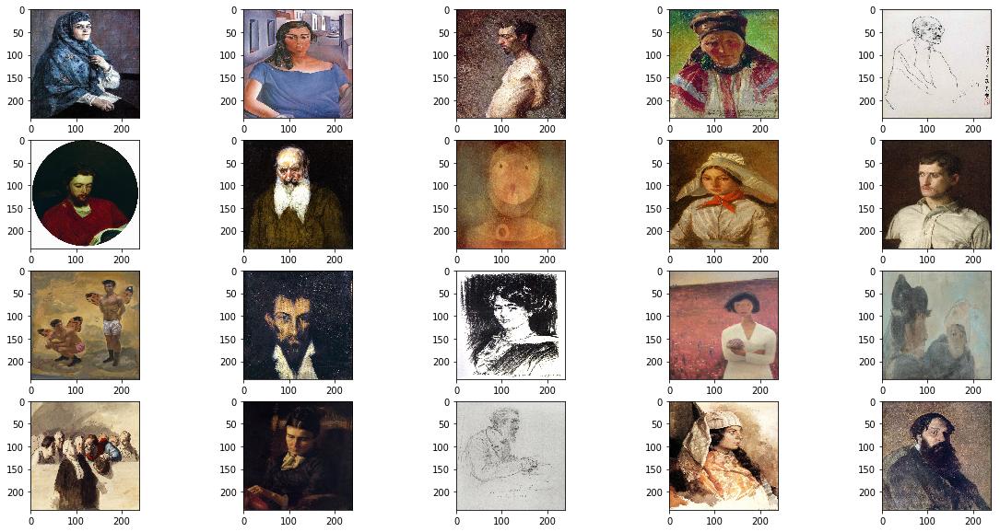

In [328]:
plt.figure(figsize = (20, 10))

n = 1
for ima in X_train_check[:20]:
    plt.subplot(4, 5, n)
    imgplot = plt.imshow(ima)
    n += 1
plt.show()

In [329]:
n = 3

model_re_ex_po_color = keras.models.Sequential([
    keras.layers.Conv2D(2**n, (5,5), activation='relu', input_shape=(maxdim, maxdim, 3)),
    keras.layers.Conv2D(2**(n), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    #below is new
    keras.layers.Dense(2**(n), activation='relu'),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+1), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+1), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+2), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+2), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.2),

    keras.layers.Flatten(),
    keras.layers.Dense(2**(n+3), activation='relu'),
    keras.layers.Dense(2, activation = 'sigmoid')
])

In [330]:
learning_rate=0.04
momentum = 0.15

opt = keras.optimizers.SGD(learning_rate = learning_rate, momentum = momentum)

model_re_ex_po_color.compile(optimizer = opt,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

start = time.time()
history_re_ex_po_color = model_re_ex_po_color.fit_generator(train_gen_re_ex_po_color, 
                              steps_per_epoch = 3,
                              epochs = 128, 
                             validation_data = test_gen_re_ex_po_color,
                             validation_steps = 3)
end = time.time()
time_re_ex_po_color = end - start

Epoch 1/128
3/3 [==============================] - 20s 7s/step - loss: 0.6920 - acc: 0.5292 - val_loss: 0.6936 - val_acc: 0.4503
Epoch 2/128
3/3 [==============================] - 16s 5s/step - loss: 0.6832 - acc: 0.5236 - val_loss: 0.6941 - val_acc: 0.4216
Epoch 3/128
3/3 [==============================] - 13s 4s/step - loss: 0.6876 - acc: 0.5518 - val_loss: 0.6933 - val_acc: 0.4477
Epoch 4/128
3/3 [==============================] - 13s 4s/step - loss: 0.6813 - acc: 0.5475 - val_loss: 0.6933 - val_acc: 0.4739
Epoch 5/128
3/3 [==============================] - 17s 6s/step - loss: 0.6903 - acc: 0.5390 - val_loss: 0.6892 - val_acc: 0.5932
Epoch 6/128
3/3 [==============================] - 17s 6s/step - loss: 0.6772 - acc: 0.5615 - val_loss: 0.6910 - val_acc: 0.5128
Epoch 7/128
3/3 [==============================] - 13s 4s/step - loss: 0.6908 - acc: 0.5576 - val_loss: 0.6886 - val_acc: 0.6327
Epoch 8/128
3/3 [==============================] - 17s 6s/step - loss: 0.6819 - acc: 0.5805 - val

## 1. Analysis of Models

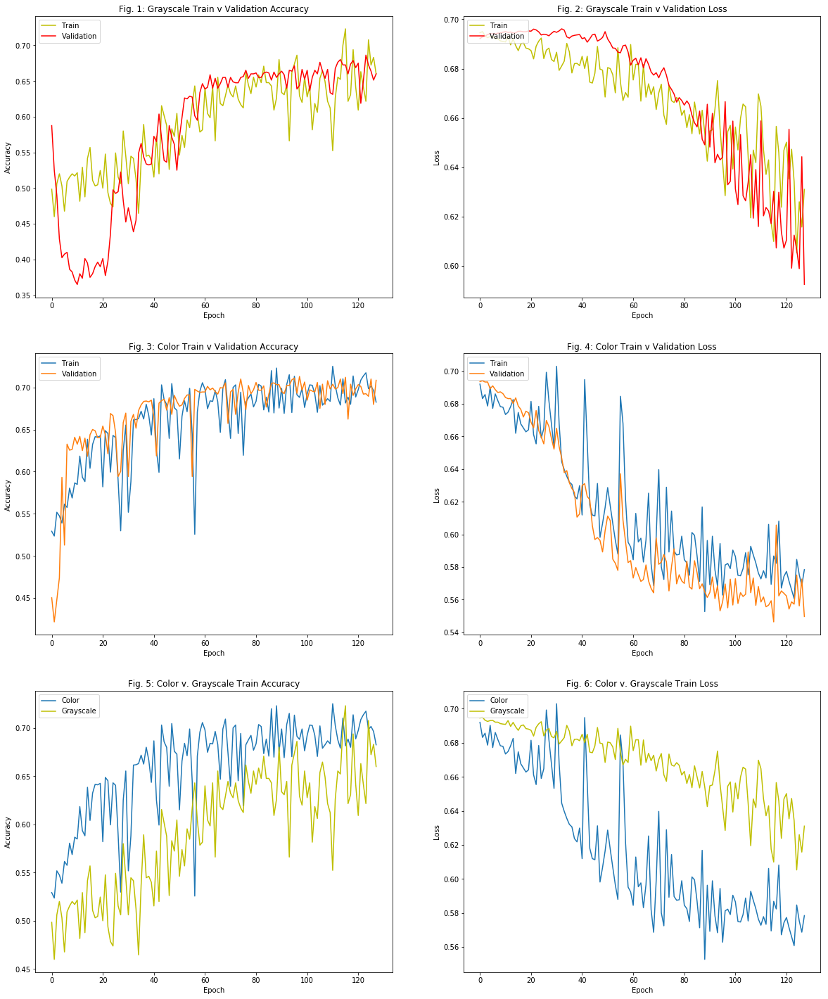

In [450]:
plt.figure(figsize = (20, 25))

plt.subplot(3, 2, 1)
plt.plot(history_re_ex_po_gray.history['acc'], 'y-')
plt.plot(history_re_ex_po_gray.history['val_acc'], 'r-')
plt.title('Fig. 1: Grayscale Train v Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 2)
plt.plot(history_re_ex_po_gray.history['loss'], 'y-')
plt.plot(history_re_ex_po_gray.history['val_loss'], 'r-')
plt.title('Fig. 2: Grayscale Train v Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 3)
plt.plot(history_re_ex_po_color.history['acc'])
plt.plot(history_re_ex_po_color.history['val_acc'])
plt.title('Fig. 3: Color Train v Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 4)
plt.plot(history_re_ex_po_color.history['loss'])
plt.plot(history_re_ex_po_color.history['val_loss'])
plt.title('Fig. 4: Color Train v Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 5)
plt.plot(history_re_ex_po_color.history['acc'])
plt.plot(history_re_ex_po_gray.history['acc'], 'y-')
plt.title('Fig. 5: Color v. Grayscale Train Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Color', 'Grayscale'], loc='upper left')

plt.subplot(3, 2, 6)
plt.plot(history_re_ex_po_color.history['loss'])
plt.plot(history_re_ex_po_gray.history['loss'], 'y-')
plt.title('Fig. 6: Color v. Grayscale Train Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Color', 'Grayscale'], loc='upper left')

plt.show()

Now that both models have been run, analysis can begin for the first test.

Looking at **Fig. 5**, it can be seen that the color model's test accuracy is consistently higher than that of the grayscale model's at all points. There are points throughout in which the grayscale accuracy comes close to that of the color's, and someonetimes meets it, yet it then will dip back below. What's particularly interesting to note is that the grayscale's accuracy tends to jump up and down much more severely than that of the color's. Around epoch 70, both models start to congregate around certain accuracy values that they jump below and above for the rest of the epochs as opposed to maintaining a more upward trend, with color at about 0.68 and grayscale at about 0.63, but not before taking a jump in the final few epochs and ending at roughly 0.65.

Taking color's more steady upward trend in the first 20 epochs combined with having less severe jumps throughout its climb, I would say that this is certainly an indication that training off of color images allows the model more necessary information in a more finely-tuned adjusting of the weights it's working with. While grayscale images do seemingly hold up to an extent since, by the end, its accuracy is only a few points lower, we can very much see how having such a rocky climb compared to color's keeps it from having a higher accuracy in the end.

Looking at **Fig. 6**, the difference in trends between the loss values is much more significant. Both begin at just below 0.7, but the color model drops much more steeply than the grayscale model. Both models seemingly go at a certain rate for a while, drop a bit more quickly, and then taper out a bit. The color model starts to congregate around a loss value of 0.58 and the grayscale model at 0.64.

Interestingly, in comparison to the climbs in accuracy of **Fig. 5**, the descent of color's loss is much more rocky than that of gray's, which is much smoother. Yet, this does not affect color in having a consistently lower loss than gray.

For further analysis, I've made a function that returns both a confusion matrix made by averaging confusion matrices from 75 tests together to allow us an idea of where the model's biases lie and how errors differ between using grayscale and color images, and a list of accuracy scores from the same tests. This will allow for further visualization, statistical insight, and comparison.

In [375]:
def want_acc_cm(model, test_generator):
    all_cf = []
    all_acc = []
    
    for i in range(75):
        x_gen,y_gen = test_generator.next()
        y_pred = model.predict_classes(np.array(x_gen))

        yt = [np.where(x == 1)[0][0] for x in y_gen]

        cf = confusion_matrix(yt, y_pred)
        acc = (cf[0][0] + cf[1][1]) / sum(sum(cf))
        cf = np.around(cf, 2)
        all_cf.append(cf/sum(sum(cf)))
        all_acc.append(acc)
        
    gen_cf = np.around(sum(all_cf)/len(all_cf), 2)
    
    return gen_cf, all_acc

In [398]:
cm_re_ex_po_gray, accall_re_ex_po_gray = want_acc_cm(model_re_ex_po_gray, test_gen_re_ex_po_gray)
cm_re_ex_po_color, accall_re_ex_po_color = want_acc_cm(model_re_ex_po_color, test_gen_re_ex_po_color)

dbacc = pd.DataFrame()
dbacc['re_ex_po_color'] = accall_re_ex_po_color
dbacc['re_ex_po_gray'] = accall_re_ex_po_gray

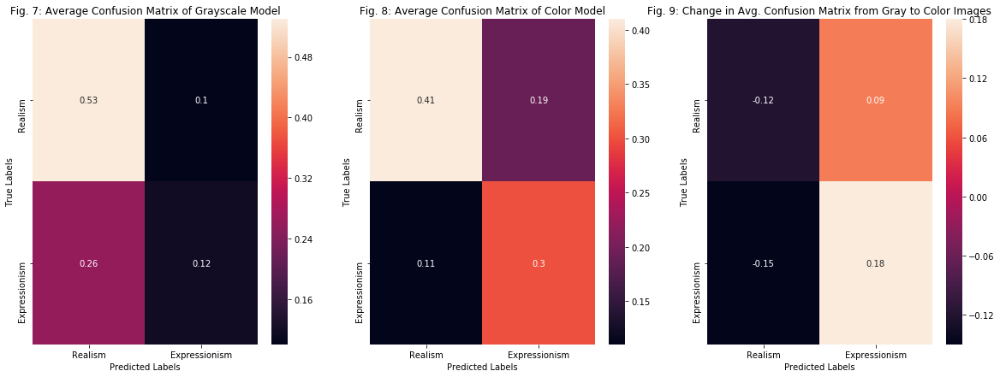

In [455]:
plt.figure(figsize = (20, 7))

ax1 = plt.subplot(1, 3, 1)

sns.heatmap(cm_re_ex_po_gray, annot=True, ax = ax1)

ax1.set_xlabel('Predicted Labels')
ax1.set_ylabel('True Labels')
ax1.set_title('Fig. 7: Average Confusion Matrix of Grayscale Model')
ax1.xaxis.set_ticklabels(['Realism', 'Expressionism'])
ax1.yaxis.set_ticklabels(['Realism', 'Expressionism'])

ax2 = plt.subplot(1, 3, 2)
sns.heatmap(cm_re_ex_po_color, annot=True, ax = ax2)

ax2.set_xlabel('Predicted Labels')
ax2.set_ylabel('True Labels')
ax2.set_title('Fig. 8: Average Confusion Matrix of Color Model')
ax2.xaxis.set_ticklabels(['Realism', 'Expressionism'])
ax2.yaxis.set_ticklabels(['Realism', 'Expressionism'])

ax3 = plt.subplot(1, 3, 3)
sns.heatmap(cm_re_ex_po_color - cm_re_ex_po_gray, annot=True, ax = ax3)

ax3.set_xlabel('Predicted Labels')
ax3.set_ylabel('True Labels')
ax3.set_title('Fig. 9: Change in Avg. Confusion Matrix from Gray to Color Images')
ax3.xaxis.set_ticklabels(['Realism', 'Expressionism'])
ax3.yaxis.set_ticklabels(['Realism', 'Expressionism'])
plt.show()

**Fig. 7** and **Fig. 8** each respectively represent the average confusion matrix of 75 tests of the grayscale and color models. **Fig. 9** then represents the change in the confusion matrix in the model when going from using grayscale images to color images, made by subtracting the grayscale CM from the color CM. 
While **Fig. 7** and **Fig. 8** are certainly useful, the information we're interested in lies in **Fig. 9** since we want to investigate their differences.

Glancing over **Fig. 9**, it's notable that both change values in the Realism column of the 'Predicted Labels' axis are negative, while the Expressionism values are positive. This may seem like an interesting coincidence, but when considering that this is binary classification and that the change in tied to the 'Predicted Labels' axis, it would make sense that becoming more accurate in predicting one class would directly affect predicting the other class. As such in this exchange, more Realism paintings got predicted as Expressionism, but less Expressionism paintings were mis-predicted now.

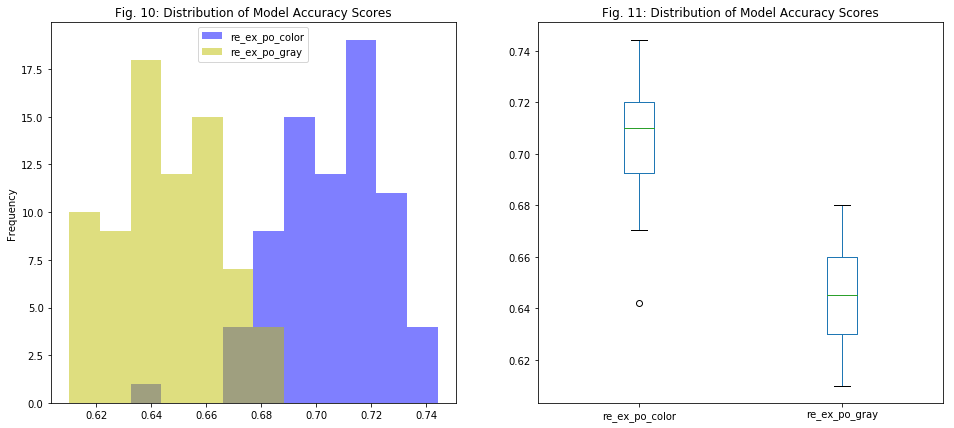

In [456]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 7))

dbacc.iloc[:, :2].plot.hist(bins = 12, alpha = 0.5, ax = ax1, 
                            title = 'Fig. 10: Distribution of Model Accuracy Scores', 
                           color = ['b', 'y'])
dbacc.iloc[:, :2].plot.box(ax = ax2, 
                           title = 'Fig. 11: Distribution of Model Accuracy Scores')
plt.show()

Now we can investigate results from the finalized models as opposed to just comparing validation accuracy as the models were training.

From **Fig. 7**, we can see that the distributions overlap a bit, with almost the same range overall and fairly normal-looking spreads. There is one obvious significant difference however, being that the grayscale distribution is centered around 0.65, while the color distribution is cenetered around 0.71.

From **Fig. 8**, we can see that in the case of the median and every quartile, the color model holds the higher value by a margin of roughly 0.06.

In [406]:
modstats = pd.DataFrame([['Realism', 'Expressionism'], ['Portrait', 'Portrait'], ['RGB', 'Grayscale']],
                        index = ['Style', 'Genre', 'Shading'], 
                        columns = ['re_ex_po_color', 're_ex_po_gray'])
modstats = modstats.append(dbacc.describe())
modstats = modstats.append(pd.DataFrame([[time_re_ex_po_color, time_re_ex_po_gray]], 
                                        index = ['time'],
                                       columns = modstats.columns))
modstats.iloc[:, :2]

,re_ex_po_color,re_ex_po_gray
Style,Realism,Expressionism
Genre,Portrait,Portrait
Shading,RGB,Grayscale
count,75,75
mean,0.706239,0.644967
std,0.0188648,0.0192094
min,0.642045,0.61
25%,0.6925,0.63
50%,0.71,0.645
75%,0.72,0.66


From the statistical description above, we can now see the actual values of the medians and quartiles from the boxplot, all of which are certainly higher for the color model than that of the grayscale model by a margin of just over 0.065.

Additionally, we can see that color holds a significantly higher mean and both models hold similar standard deviations. While we could easily assume that there's a significant difference between the models with such a margin of difference between their means, that isn't enough to prove that the models' accuracies are significantly different to us.

To check this, doing a p-test is by far the best option. I've made a quick function that runs a p-test with an alpha value of 0.05 to determine if there actually is a significant difference between the two model accuracy sets. If the resulting p-value is below 0.05, then we can reject the idea that there is no significant difference between them. If not, then there is no difference.

In [407]:
def ptest(set1, set2):
    print("Null Hypothesis: There is no significant difference between the two model accuracy samples (p-value > 0.05).")
    print("\nAlternative Hypothesis: There is a significant difference between the two model accuracy samples (p-value < 0.05).")

    ttest, pval = ttest_ind(set1, set2)

    print("\np-value: " + str(pval))

    if pval <0.05:
        print("We reject the null hypothesis.")
    else:
        print("We accept the null hypothesis.")
        
ptest(dbacc.iloc[:, 0].values, dbacc.iloc[:, 1].values)

Null Hypothesis: There is no significant difference between the two model accuracy samples (p-value > 0.05).

Alternative Hypothesis: There is a significant difference between the two model accuracy samples (p-value < 0.05).

p-value: 3.160164409591307e-43
We reject the null hypothesis.


Seeing as our p-value for this test is essentially 0 with an alpha of 0.05, we can say with certainty that the null hypothesis should be rejected in favor of the alternative hypothesis stating that there is a significant difference between the two model accuracy sets. With this in mind and knowing that the color model on average resulted in higher accuracy scores, we can say that training and testing in RGB certainly has a positive effect in accuracy in the case of predicting which of two styles a portrait painting is from.

# Test #2: Portraits vs Landscapes of Realism
## 2. Grayscale

For this test, I'll be working with two genres of the same style. I've decided to work with Realism again, and my genres will be portraits and landscapes since they're distinct enough that the test may prove a useful opposite to Test #1, where the two styles of portraits weren't as distinct. Additionally, landscapes tend to have quite specific colors that are common to them while also being quite easy to tell from a portrait.

In [137]:
temp = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Realism') & 
                     (all_info['genre'].isin(['portrait', 'landscape']) == True)].copy().reset_index(drop = True)

amount = temp['genre'].value_counts()[1]

port = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Realism') & 
                     (all_info['genre'] == 'portrait')].head(amount)

land = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Realism') & 
                     (all_info['genre'] == 'landscape')].head(amount)

train_info = pd.concat([port, land]).sample(frac=1).reset_index(drop=True)

test_info = all_info[(all_info['in_train'] == False) & 
                 (all_info['style'] == 'Realism') &
                    (all_info['genre'].isin(['portrait', 'landscape']) == True)].copy().reset_index(drop = True)

print('Train Shape: ', train_info.shape)
print('Test Shape: ', test_info.shape)

Train Shape:  (3748, 12)
Test Shape:  (1255, 12)


In [138]:
train_names = train_info.new_filename.values
test_names = test_info.new_filename.values

train_dir = 's3://paintings4ml/train'
test_dir = 's3://paintings4ml/test'

train_get = ['train/{}'.format(i) for i in train_names]
test_get = ['test/{}'.format(i) for i in test_names]

print(train_info.shape[0] == len(train_get))
print(test_info.shape[0] == len(test_get))

True
True


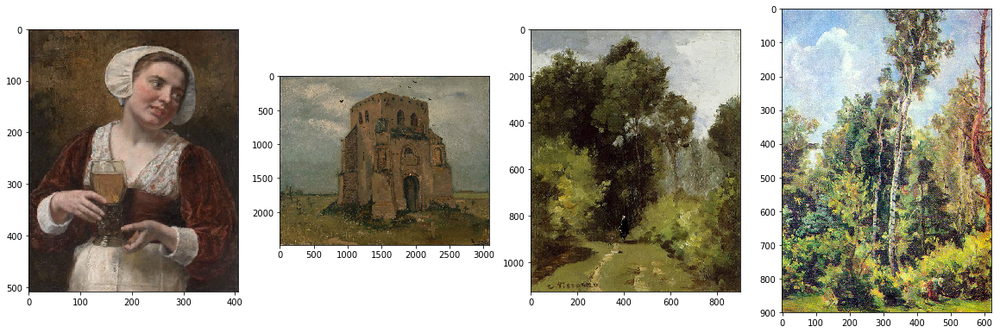

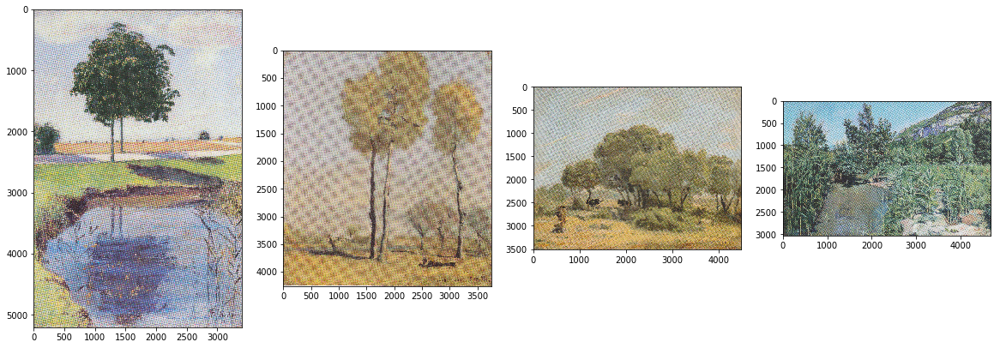

In [81]:
plt.figure(figsize = (20, 10))

n = 1
for ima in train_get[:4]:
    plt.subplot(1, 4, n)
    
    object = bucket.Object(ima)
    file_stream = io.BytesIO()
    object.download_fileobj(file_stream)
    
    img = mpimg.imread(file_stream, 0)
    imgplot = plt.imshow(img)
    n += 1
plt.show()

plt.figure(figsize = (20, 10))
n = 1
for ima in test_get[:4]:
    plt.subplot(1, 4, n)
    
    object = bucket.Object(ima)
    file_stream = io.BytesIO()
    object.download_fileobj(file_stream)
    
    img = mpimg.imread(file_stream, 0)
    imgplot = plt.imshow(img)
    n += 1
plt.show()

In [82]:
start = time.time()

X_train_check = proc_img(train_get[:2650], 1)
X_test_check = proc_img(test_get, 1)

end = time.time()
print(end - start)

478.54445123672485


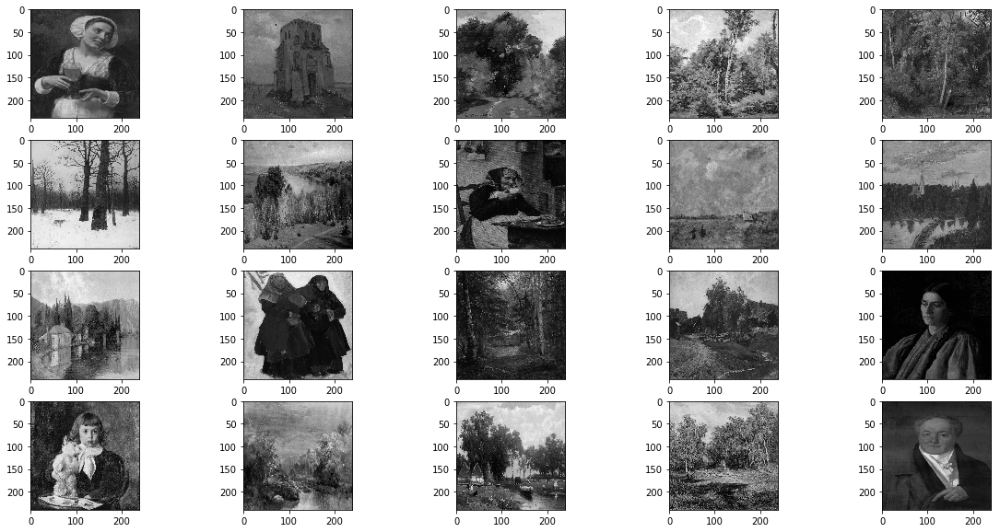

In [90]:
plt.figure(figsize = (20, 10))

n = 1
for ima in X_train_check[:20]:
    plt.subplot(4, 5, n)
    imgplot = plt.imshow(ima, cmap="gray", vmin=0, vmax=255)
    n += 1
plt.show()

In [104]:
y_train = train_info['genre'].copy()
y_train = y_train.replace({'portrait' : 1, 
                 'landscape' : 2})

y_test = test_info['genre'].copy()
y_test = y_test.replace({'portrait' : 1, 
                 'landscape' : 2})

print(train_info.shape[0] == len(y_train))
print(test_info.shape[0] == len(y_test))

True
True


In [105]:
y_train_check = get_val_array(y_train[:2650])
y_test_check = get_val_array(y_test)

In [106]:
index = [i for i, x in enumerate(X_train_check) if (x is 0)]
X_train = [expand_dims(x, axis=2) for i,x in enumerate(X_train_check) if i not in index]
y_train = [x for i,x in enumerate(list(y_train_check[:2650])) if i not in index]

print(len(X_train), len(y_train))

2641 2641


In [107]:
index = [i for i, x in enumerate(X_test_check) if (x is 0)]
X_test = [expand_dims(x, axis=2) for i,x in enumerate(X_test_check) if i not in index]
y_test = [x for i,x in enumerate(list(y_test_check[:2000])) if i not in index]

print(len(X_test), len(y_test))

1247 1247


In [108]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range = 0, 
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  shear_range = 0.1 ,
                                  zoom_range = 0.1,
                                  horizontal_flip = False)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_re_po_la_gray = train_datagen.flow(np.array(X_train[:2600]), 
                                     np.array(y_train[:2600]), 
                                     batch_size = 325)
test_gen_re_po_la_gray = test_datagen.flow(np.array(X_test), 
                                   np.array(y_test), 
                                   batch_size = 400, 
                                  shuffle = True)

In [109]:
n = 3

model_re_po_la_gray = keras.models.Sequential([
    keras.layers.Conv2D(2**n, (5,5), activation='relu', input_shape=(maxdim, maxdim, 1)),
    keras.layers.Conv2D(2**(n), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    #below is new
    keras.layers.Dense(2**(n), activation='relu'),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+1), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+1), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+2), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+2), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.2),

    keras.layers.Flatten(),
    keras.layers.Dense(2**(n+3), activation='relu'),
    keras.layers.Dense(2, activation = 'sigmoid')
])

In [110]:
learning_rate=0.04
momentum = 0.15

opt = keras.optimizers.SGD(learning_rate = learning_rate, momentum = momentum)

model_re_po_la_gray.compile(optimizer = opt,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

start = time.time()
history_re_po_la_gray = model_re_po_la_gray.fit_generator(train_gen_re_po_la_gray, 
                              steps_per_epoch = 1,
                              epochs = 128, 
                             validation_data = test_gen_re_po_la_gray,
                             validation_steps = 1)
end = time.time()
time_re_po_la_gray = end - start

Epoch 1/128
Epoch 1/128
1/1 [==============================] - 8s 8s/step - loss: 0.6946 - acc: 0.4477 - val_loss: 0.6926 - val_acc: 0.4613
Epoch 2/128
Epoch 1/128
1/1 [==============================] - 4s 4s/step - loss: 0.6918 - acc: 0.4769 - val_loss: 0.6895 - val_acc: 0.5425
Epoch 3/128
Epoch 1/128
1/1 [==============================] - 4s 4s/step - loss: 0.6865 - acc: 0.5277 - val_loss: 0.6861 - val_acc: 0.5337
Epoch 4/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6826 - acc: 0.5138 - val_loss: 0.6825 - val_acc: 0.5337
Epoch 5/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6816 - acc: 0.4954 - val_loss: 0.6799 - val_acc: 0.5337
Epoch 6/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6774 - acc: 0.5123 - val_loss: 0.6772 - val_acc: 0.5350
Epoch 7/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6680 - acc: 0.5246 - val_loss: 0.6730 - val_acc: 0.5362
Epoch 8/128
Epoch 1/

## 2. Color

In [139]:
start = time.time()

X_train_check = proc_img(train_get[:2650], 3)
X_test_check = proc_img(test_get, 3)

end = time.time()
print(end - start)

465.0174813270569


In [140]:
y_train = train_info['genre'].copy()
y_train = y_train.replace({'portrait' : 1, 
                 'landscape' : 2})

y_test = test_info['genre'].copy()
y_test = y_test.replace({'portrait' : 1, 
                 'landscape' : 2})

print(train_info.shape[0] == len(y_train))
print(test_info.shape[0] == len(y_test))

True
True


In [141]:
y_train_check = get_val_array(y_train[:2650])
y_test_check = get_val_array(y_test)

In [142]:
index = [i for i, x in enumerate(X_train_check) if (x is 0) or (x.shape != (240, 240, 3))]
X_train = [x for i,x in enumerate(X_train_check) if i not in index]
y_train = [x for i,x in enumerate(list(y_train_check[:2750])) if i not in index]

print(len(X_train), len(y_train))

2639 2639


In [143]:
index = [i for i, x in enumerate(X_test_check) if (x is 0) or (x.shape != (240, 240, 3))]
X_test = [x for i,x in enumerate(X_test_check) if i not in index]
y_test = [x for i,x in enumerate(list(y_test_check[:2000])) if i not in index]

print(len(X_test), len(y_test))

1246 1246


In [146]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range = 0, 
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  shear_range = 0.1 ,
                                  zoom_range = 0.1,
                                  horizontal_flip = False)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_re_po_la_color = train_datagen.flow(np.array(X_train)[:2600], 
                                     np.array(y_train)[:2600], 
                                     batch_size = 325)
test_gen_re_po_la_color = test_datagen.flow(np.array(X_test)[:1200], 
                                   np.array(y_test)[:1200], 
                                   batch_size = 400, 
                                  shuffle = True)

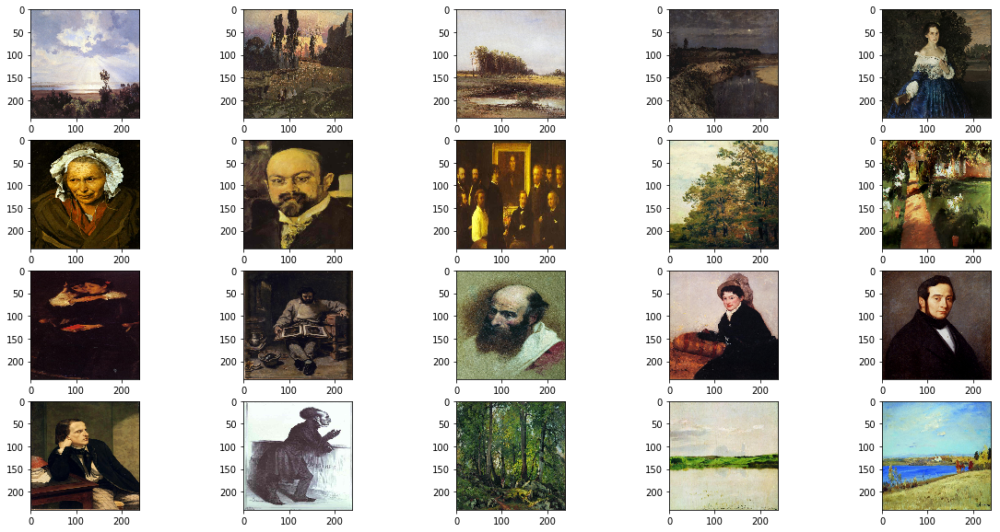

In [147]:
plt.figure(figsize = (20, 10))

n = 1
for ima in X_train_check[:20]:
    plt.subplot(4, 5, n)
    imgplot = plt.imshow(ima)
    n += 1
plt.show()

In [148]:
n = 3

model_re_po_la_color = keras.models.Sequential([
    keras.layers.Conv2D(2**n, (5,5), activation='relu', input_shape=(maxdim, maxdim, 3)),
    keras.layers.Conv2D(2**(n), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    #below is new
    keras.layers.Dense(2**(n), activation='relu'),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+1), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+1), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+2), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+2), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.2),

    keras.layers.Flatten(),
    keras.layers.Dense(2**(n+3), activation='relu'),
    keras.layers.Dense(2, activation = 'sigmoid')
])

In [149]:
learning_rate=0.04
momentum = 0.15

opt = keras.optimizers.SGD(learning_rate = learning_rate, momentum = momentum)

model_re_po_la_color.compile(optimizer = opt,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

start = time.time()
history_re_po_la_color = model_re_po_la_color.fit_generator(train_gen_re_po_la_color, 
                              steps_per_epoch = 3,
                              epochs = 128, 
                             validation_data = test_gen_re_po_la_color,
                             validation_steps = 3)
end = time.time()
time_re_po_la_color = end - start

Epoch 1/128
3/3 [==============================] - 21s 7s/step - loss: 0.6926 - acc: 0.5174 - val_loss: 0.6899 - val_acc: 0.5721
Epoch 2/128
3/3 [==============================] - 17s 6s/step - loss: 0.6881 - acc: 0.5313 - val_loss: 0.6849 - val_acc: 0.5492
Epoch 3/128
3/3 [==============================] - 18s 6s/step - loss: 0.6850 - acc: 0.5087 - val_loss: 0.6804 - val_acc: 0.5512
Epoch 4/128
3/3 [==============================] - 18s 6s/step - loss: 0.6792 - acc: 0.5056 - val_loss: 0.6735 - val_acc: 0.5704
Epoch 5/128
3/3 [==============================] - 18s 6s/step - loss: 0.6691 - acc: 0.5133 - val_loss: 0.6629 - val_acc: 0.6317
Epoch 6/128
3/3 [==============================] - 18s 6s/step - loss: 0.6640 - acc: 0.5651 - val_loss: 0.6538 - val_acc: 0.7171
Epoch 7/128
3/3 [==============================] - 18s 6s/step - loss: 0.6272 - acc: 0.6441 - val_loss: 0.6219 - val_acc: 0.7067
Epoch 8/128
3/3 [==============================] - 18s 6s/step - loss: 0.6184 - acc: 0.6641 - val

## 2. Analysis of Models

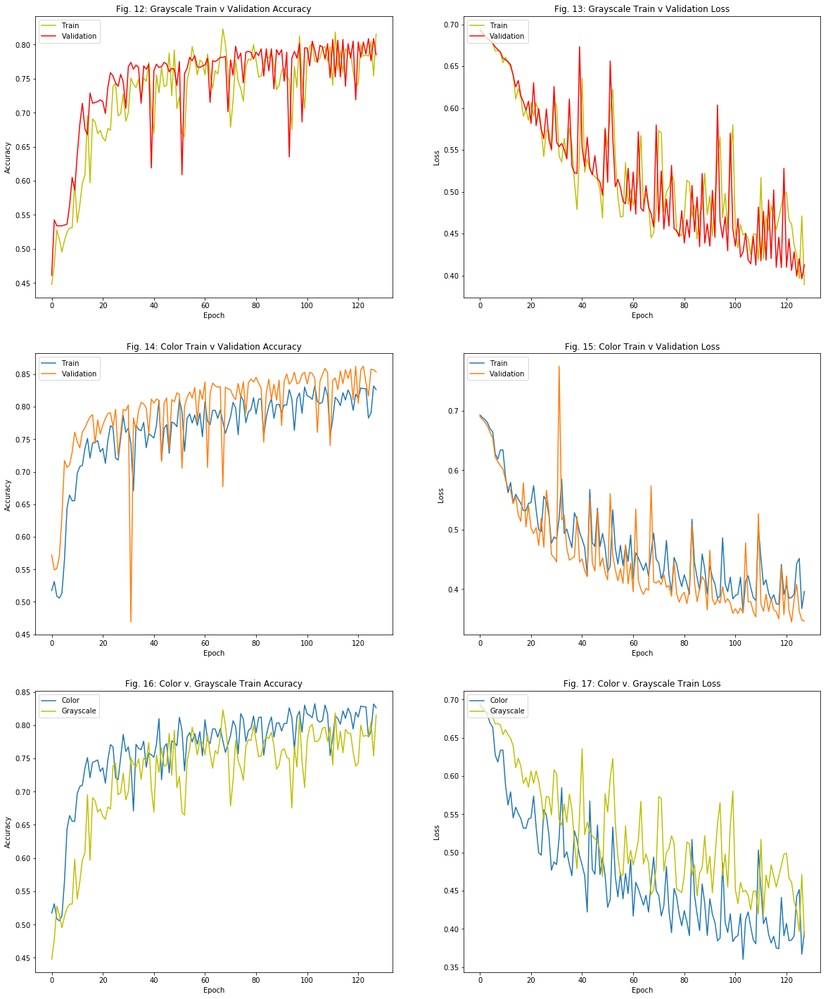

In [459]:
plt.figure(figsize = (20, 25))

plt.subplot(3, 2, 1)
plt.plot(history_re_po_la_gray.history['acc'], 'y-')
plt.plot(history_re_po_la_gray.history['val_acc'], 'r-')
plt.title('Fig. 12: Grayscale Train v Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 2)
plt.plot(history_re_po_la_gray.history['loss'], 'y-')
plt.plot(history_re_po_la_gray.history['val_loss'], 'r-')
plt.title('Fig. 13: Grayscale Train v Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 3)
plt.plot(history_re_po_la_color.history['acc'])
plt.plot(history_re_po_la_color.history['val_acc'])
plt.title('Fig. 14: Color Train v Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 4)
plt.plot(history_re_po_la_color.history['loss'])
plt.plot(history_re_po_la_color.history['val_loss'])
plt.title('Fig. 15: Color Train v Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(3, 2, 5)
plt.plot(history_re_po_la_color.history['acc'])
plt.plot(history_re_po_la_gray.history['acc'], 'y-')
plt.title('Fig. 16: Color v. Grayscale Train Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Color', 'Grayscale'], loc='upper left')

plt.subplot(3, 2, 6)
plt.plot(history_re_po_la_color.history['loss'])
plt.plot(history_re_po_la_gray.history['loss'], 'y-')
plt.title('Fig. 17: Color v. Grayscale Train Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Color', 'Grayscale'], loc='upper left')

plt.show()

**Fig. 16** shows a pretty neat change in training results compared to that of Test #1. We saw in **Fig. 5** that grayscale had a much more rocky climb than color did, along with having some notable gaps between the two. Here we can see that grayscale still maintained jumps that are more severe than color's, yet grayscale was nearly toe-to-toe with color at most points with a much smaller gap between the two than we saw in Test #1. By the end, color has congregated around 0.81 and grayscale at 0.79.

While the jumps in grayscale's climb seem to be less severe than seen in Test #1, it's also important to note that this weakening in severity also seemed to have allowed grayscale's accuracy to stay much closer to color's than before. As such, this severity may likely be dependent on the classes we're training on themselves, which makes sense since determining between a portrait and a landscape seems like a much simpler task than determining between styles of all portraits.

Looking now at **Fig. 17**, grayscale's descent is again much closer to color's than seen previously in **Fig. 6**. Yet now, grayscale seems to be much rockier than it was before, such that it's now rockier than color's descent.

In [410]:
cm_re_po_la_gray, accall_re_po_la_gray = want_acc_cm(model_re_po_la_gray, test_gen_re_po_la_gray)
cm_re_po_la_color, accall_re_po_la_color = want_acc_cm(model_re_po_la_color, test_gen_re_po_la_color)

dbacc['re_po_la_color'] = accall_re_po_la_color
dbacc['re_po_la_gray'] = accall_re_po_la_gray

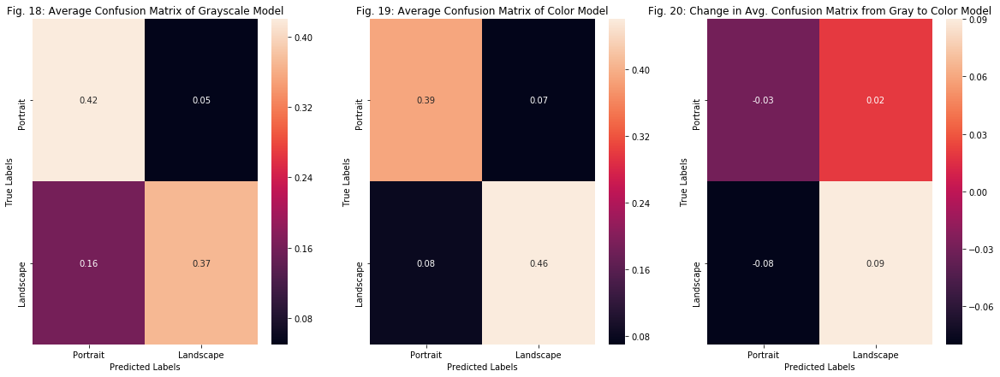

In [422]:
plt.figure(figsize = (20, 7))

ax1 = plt.subplot(1, 3, 1)

sns.heatmap(cm_re_po_la_gray, annot=True, ax = ax1)

ax1.set_xlabel('Predicted Labels')
ax1.set_ylabel('True Labels')
ax1.set_title('Fig. 18: Average Confusion Matrix of Grayscale Model')
ax1.xaxis.set_ticklabels(['Portrait', 'Landscape'])
ax1.yaxis.set_ticklabels(['Portrait', 'Landscape'])

ax2 = plt.subplot(1, 3, 2)
sns.heatmap(cm_re_po_la_color, annot=True, ax = ax2)

ax2.set_xlabel('Predicted Labels')
ax2.set_ylabel('True Labels')
ax2.set_title('Fig. 19: Average Confusion Matrix of Color Model')
ax2.xaxis.set_ticklabels(['Portrait', 'Landscape'])
ax2.yaxis.set_ticklabels(['Portrait', 'Landscape'])

ax3 = plt.subplot(1, 3, 3)
sns.heatmap(cm_re_po_la_color - cm_re_po_la_gray, annot=True, ax = ax3)

ax3.set_xlabel('Predicted Labels')
ax3.set_ylabel('True Labels')
ax3.set_title('Fig. 20: Change in Avg. Confusion Matrix from Gray to Color Model')
ax3.xaxis.set_ticklabels(['Portrait', 'Landscape'])
ax3.yaxis.set_ticklabels(['Portrait', 'Landscape'])
plt.show()

In **Fig. 20**, we can see that again, just like in **Fig. 9**, that the values of one prediction column are both negative while the values of the other are both positive. However, this time around, the value changes are less severe than we saw in Test #1.

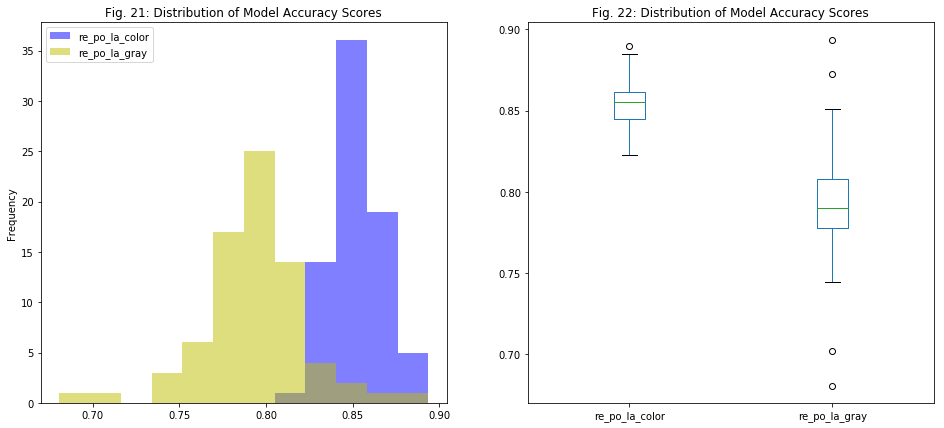

In [457]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 7))
dbacc[['re_po_la_color', 're_po_la_gray']].plot.hist(bins = 12, alpha = 0.5, ax = ax1, 
                            title = 'Fig. 21: Distribution of Model Accuracy Scores', 
                            color = ['b', 'y'])
dbacc[['re_po_la_color', 're_po_la_gray']].plot.box(ax = ax2, 
                           title = 'Fig. 22: Distribution of Model Accuracy Scores')
plt.show()

In **Fig. 21**, we can see that both models have fairly normal-looking accuracy distributions, while the grayscale model has a range that's roughly twice as broad as that of the color model, such that the highest distribution point for the gray model is ten points lower than the highest color distribution point. The gray model is centered on roughly 0.8, while the color model is centered on roughly 0.85.

In **Fig. 22**, we can see that the median and quartiles of the color model are all varying degrees higher than that of the gray model, ranging from differences of 0.03 to 0.07. Additionally, as we could see from the ranges of distributions in **Fig. 21**, color's boxplot is much tighter together than the gray boxplot.

In [416]:
temp = pd.DataFrame()
temp = pd.DataFrame([['Realism', 'Realism'], 
                     ['Portrait / Landscape', 'Portrait / Landscape'], 
                     ['RGB', 'Grayscale']],
                        index = ['Style', 'Genre', 'Shading'], 
                        columns = ['re_po_la_color', 're_po_la_gray'])

temp = temp.append(dbacc.iloc[:, 2:].describe())
temp = temp.append(pd.DataFrame([[time_re_po_la_color, time_re_po_la_gray]], 
                                        index = ['time'],
                                       columns = temp.columns))
temp['-'] = ""
temp = temp[['-', 're_po_la_color', 're_po_la_gray']]

modstats = pd.concat([modstats, temp], axis = 1)
modstats.iloc[:, 3:5]

,re_po_la_color,re_po_la_gray
Style,Realism,Realism
Genre,Portrait / Landscape,Portrait / Landscape
Shading,RGB,Grayscale
count,75,75
mean,0.853333,0.788968
std,0.0126433,0.032807
min,0.8275,0.659574
25%,0.84375,0.78
50%,0.855,0.7925
75%,0.8625,0.80125


Viewing the chart above, we can be very assured that the mean and quartile values of the color accuracy are certainly higher than that of the grayscale model. Seeing that the standard deviation of the color model is so much smaller than the grayscale model, it's easy to now understand why the color model's histogram and boxplot had much smaller ranges than that of the grayscale model.

In [417]:
ptest(dbacc.iloc[:, 2].values, dbacc.iloc[:, 3].values)

Null Hypothesis: There is no significant difference between the two model accuracy samples (p-value > 0.05).

Alternative Hypothesis: There is a significant difference between the two model accuracy samples (p-value < 0.05).

p-value: 2.330470217648352e-33
We reject the null hypothesis.


Just like with Test #1, the p-value here is essentially zero, such that there's unarguably a significant difference between the two model's accuracy samples regardless of what alpha value we might attempt to use here. Now that we know that the inclusion of three full RGB layers in an image's data as opposed to using a single grayscale layer when loading it into an image recognition model for training has such an undeniably large influence on the model's accuracy when testing, this time being in the instance of determining which of two genres paintings from the same style are of, we now have further proof that color is quiet important when it comes to image recognition.

# Test #3: All Genres of Realism vs Expressionism
## 3. Grayscale

For this test, I've decided to work with Realism and Expressionism again. However, this time I'll be working with any painting from either style, and thus all genres instead of focusing on a specific genre again. Seeing as there will be no consistent form and subject across the styles to tie them together, this will then lead the model to likely heavily relying on common palettes in each style to determine which is which, and can thus help us to determine the degree of importance of color overall.

In [206]:
amount = 1350

real = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Realism')].head(amount)

exp = all_info[(all_info['in_train'] == True) & 
                 (all_info['style'] == 'Expressionism')].head(amount)

train_info = pd.concat([real, exp]).sample(frac=1).reset_index(drop=True)

test_info = all_info[(all_info['in_train'] == False) & 
                 (all_info['style'].isin(['Realism', 'Expressionism']))].head(1250).reset_index(drop = True)

print('Train Shape: ', train_info.shape)
print('Test Shape: ', test_info.shape)

Train Shape:  (2700, 12)
Test Shape:  (1250, 12)


In [207]:
train_names = train_info.new_filename.values
test_names = test_info.new_filename.values

train_dir = 's3://paintings4ml/train'
test_dir = 's3://paintings4ml/test'

train_get = ['train/{}'.format(i) for i in train_names]
test_get = ['test/{}'.format(i) for i in test_names]

In [208]:
print(train_info.shape[0] == len(train_get))
print(test_info.shape[0] == len(test_get))

True
True


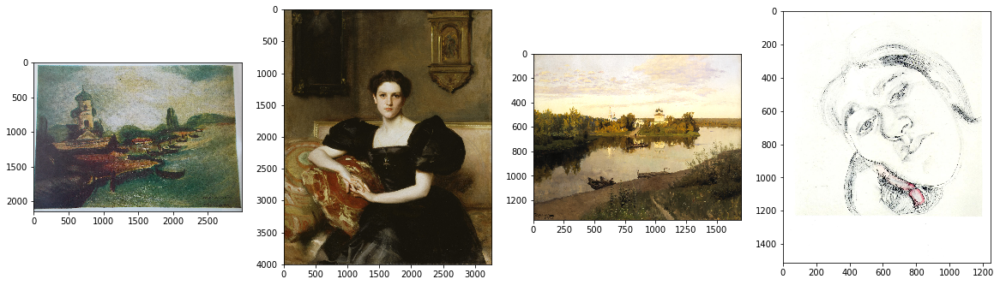

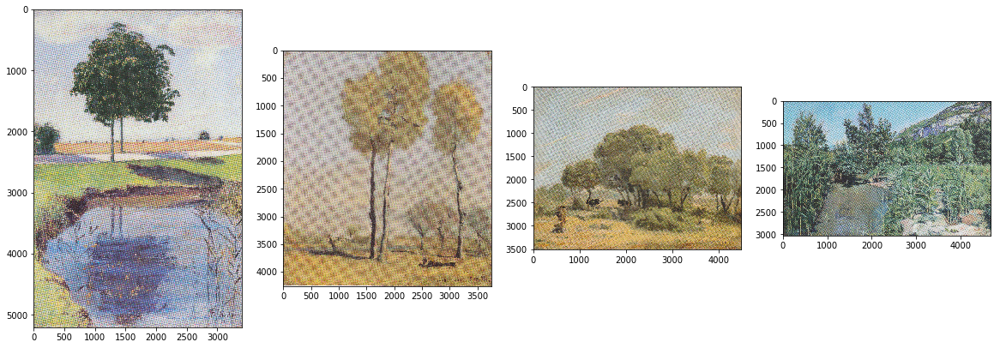

In [209]:
plt.figure(figsize = (20, 10))

n = 1
for ima in train_get[:4]:
    plt.subplot(1, 4, n)
    
    object = bucket.Object(ima)
    file_stream = io.BytesIO()
    object.download_fileobj(file_stream)
    
    img = mpimg.imread(file_stream, 0)
    imgplot = plt.imshow(img)
    n += 1
plt.show()

plt.figure(figsize = (20, 10))
n = 1
for ima in test_get[:4]:
    plt.subplot(1, 4, n)
    
    object = bucket.Object(ima)
    file_stream = io.BytesIO()
    object.download_fileobj(file_stream)
    
    img = mpimg.imread(file_stream, 0)
    imgplot = plt.imshow(img)
    n += 1
plt.show()

In [210]:
start = time.time()

X_train_check = proc_img(train_get, 1)
X_test_check = proc_img(test_get, 1)

end = time.time()
print(end - start)

780.6368060112


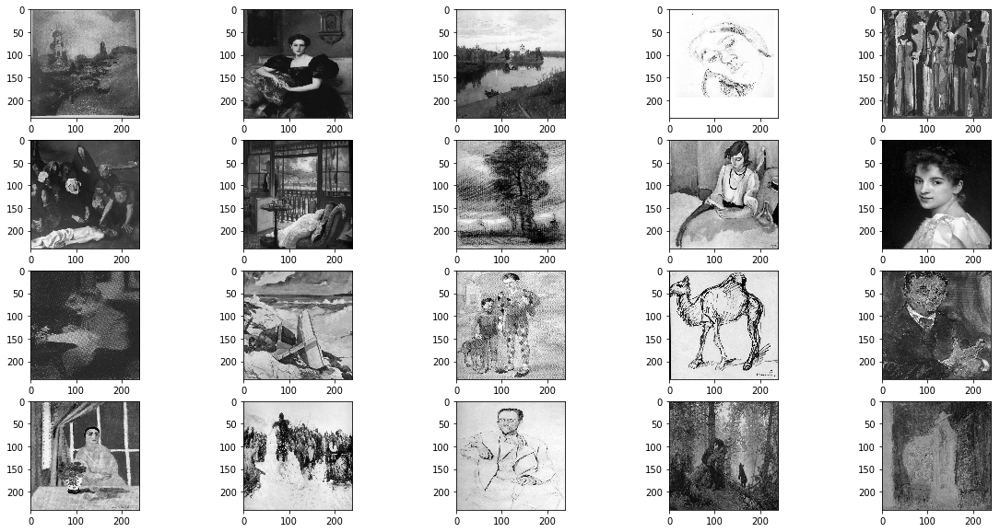

In [211]:
plt.figure(figsize = (20, 10))

n = 1
for ima in X_train_check[:20]:
    plt.subplot(4, 5, n)
    imgplot = plt.imshow(ima, cmap="gray", vmin=0, vmax=255)
    n += 1
plt.show()

In [212]:
y_train = train_info['style'].copy()
y_train = y_train.replace({'Realism' : 1, 
                 'Expressionism' : 2})

y_test = test_info['style'].copy()
y_test = y_test.replace({'Realism' : 1, 
                 'Expressionism' : 2})

print(train_info.shape[0] == len(y_train))
print(test_info.shape[0] == len(y_test))

True
True


In [213]:
y_train_check = get_val_array(y_train)
y_test_check = get_val_array(y_test)

In [214]:
index = [i for i, x in enumerate(X_train_check) if (x is 0)]
X_train = [expand_dims(x, axis=2) for i,x in enumerate(X_train_check) if i not in index]
y_train = [x for i,x in enumerate(list(y_train_check[:2750])) if i not in index]

print(len(X_train), len(y_train))

2668 2668


In [215]:
index = [i for i, x in enumerate(X_test_check) if (x is 0)]
X_test = [expand_dims(x, axis=2) for i,x in enumerate(X_test_check) if i not in index]
y_test = [x for i,x in enumerate(list(y_test_check[:2000])) if i not in index]

print(len(X_test), len(y_test))

1238 1238


In [216]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range = 0, 
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  shear_range = 0.1 ,
                                  zoom_range = 0.1,
                                  horizontal_flip = False)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_re_ex_all_gray = train_datagen.flow(np.array(X_train[:2600]), 
                                     np.array(y_train[:2600]), 
                                     batch_size = 325)
test_gen_re_ex_all_gray = test_datagen.flow(np.array(X_test[:1200]), 
                                   np.array(y_test[:1200]), 
                                   batch_size = 400, 
                                  shuffle = True)

In [217]:
n = 3

model_re_ex_all_gray = keras.models.Sequential([
    keras.layers.Conv2D(2**n, (5,5), activation='relu', input_shape=(maxdim, maxdim, 1)),
    keras.layers.Conv2D(2**(n), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    #below is new
    keras.layers.Dense(2**(n), activation='relu'),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+1), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+1), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+2), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+2), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.2),

    keras.layers.Flatten(),
    keras.layers.Dense(2**(n+3), activation='relu'),
    keras.layers.Dense(2, activation = 'sigmoid')
])

In [218]:
learning_rate=0.04
momentum = 0.15

opt = keras.optimizers.SGD(learning_rate = learning_rate, momentum = momentum)

model_re_ex_all_gray.compile(optimizer = opt,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

start = time.time()
history_re_ex_all_gray = model_re_ex_all_gray.fit_generator(train_gen_re_ex_all_gray, 
                              steps_per_epoch = 1,
                              epochs = 128, 
                             validation_data = test_gen_re_ex_all_gray,
                             validation_steps = 1)
end = time.time()
time_re_ex_all_gray = end - start

Epoch 1/128
Epoch 1/128
1/1 [==============================] - 8s 8s/step - loss: 0.6947 - acc: 0.4815 - val_loss: 0.6935 - val_acc: 0.4825
Epoch 2/128
Epoch 1/128
1/1 [==============================] - 5s 5s/step - loss: 0.6930 - acc: 0.5138 - val_loss: 0.6939 - val_acc: 0.4500
Epoch 3/128
Epoch 1/128
1/1 [==============================] - 4s 4s/step - loss: 0.6935 - acc: 0.4938 - val_loss: 0.6941 - val_acc: 0.4125
Epoch 4/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6935 - acc: 0.5169 - val_loss: 0.6940 - val_acc: 0.4100
Epoch 5/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6926 - acc: 0.5292 - val_loss: 0.6939 - val_acc: 0.4200
Epoch 6/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6928 - acc: 0.5154 - val_loss: 0.6938 - val_acc: 0.4338
Epoch 7/128
Epoch 1/128
1/1 [==============================] - 3s 3s/step - loss: 0.6925 - acc: 0.5062 - val_loss: 0.6941 - val_acc: 0.4150
Epoch 8/128
Epoch 1/

## 3. Color

In [231]:
start = time.time()

X_train_check = proc_img(train_get, 3)
X_test_check = proc_img(test_get, 3)

end = time.time()
print(end - start)

695.3367786407471


In [232]:
y_train = train_info['style'].copy()
y_train = y_train.replace({'Realism' : 1, 
                 'Expressionism' : 2})

y_test = test_info['style'].copy()
y_test = y_test.replace({'Realism' : 1, 
                 'Expressionism' : 2})

print(train_info.shape[0] == len(y_train))
print(test_info.shape[0] == len(y_test))

True
True


In [233]:
y_train_check = get_val_array(y_train)
y_test_check = get_val_array(y_test)

In [234]:
index = [i for i, x in enumerate(X_train_check) if (x is 0) or (x.shape != (240, 240, 3))]
X_train = [x for i,x in enumerate(X_train_check) if i not in index]
y_train = [x for i,x in enumerate(list(y_train_check[:2750])) if i not in index]

print(len(X_train), len(y_train))

2660 2660


In [235]:
index = [i for i, x in enumerate(X_test_check) if (x is 0) or (x.shape != (240, 240, 3))]
X_test = [x for i,x in enumerate(X_test_check) if i not in index]
y_test = [x for i,x in enumerate(list(y_test_check[:2000])) if i not in index]

print(len(X_test), len(y_test))

1236 1236


In [236]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range = 0, 
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  shear_range = 0.1 ,
                                  zoom_range = 0.1,
                                  horizontal_flip = False)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_re_ex_all_color = train_datagen.flow(np.array(X_train)[:2600], 
                                     np.array(y_train)[:2600], 
                                     batch_size = 325)
test_gen_re_ex_all_color = test_datagen.flow(np.array(X_test)[:1200], 
                                   np.array(y_test)[:1200], 
                                   batch_size = 400, 
                                  shuffle = True)

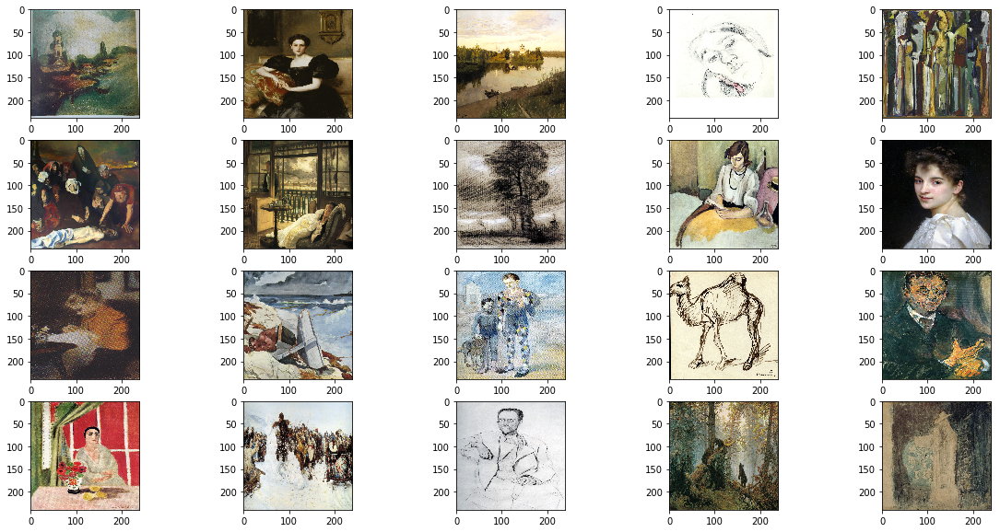

In [237]:
plt.figure(figsize = (20, 10))

n = 1
for ima in X_train_check[:20]:
    plt.subplot(4, 5, n)
    imgplot = plt.imshow(ima)
    n += 1
plt.show()

In [238]:
n = 3

model_re_ex_all_color = keras.models.Sequential([
    keras.layers.Conv2D(2**n, (5,5), activation='relu', input_shape=(maxdim, maxdim, 3)),
    keras.layers.Conv2D(2**(n), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    #below is new
    keras.layers.Dense(2**(n), activation='relu'),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+1), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+1), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Dropout(0.2),
    
    keras.layers.Conv2D(2**(n+2), (5,5), activation='relu'),
    keras.layers.Conv2D(2**(n+2), (2,2), activation='relu'),
    keras.layers.MaxPooling2D(2,2),

    keras.layers.Dropout(0.2),

    keras.layers.Flatten(),
    keras.layers.Dense(2**(n+3), activation='relu'),
    keras.layers.Dense(2, activation = 'sigmoid')
])

In [249]:
learning_rate=0.04
momentum = 0.15

opt = keras.optimizers.SGD(learning_rate = learning_rate, momentum = momentum)

model_re_ex_all_color.compile(optimizer = opt,
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

start = time.time()
history_re_ex_all_color = model_re_ex_all_color.fit_generator(train_gen_re_ex_all_color, 
                              steps_per_epoch = 3,
                              epochs = 128, 
                             validation_data = test_gen_re_ex_all_color,
                             validation_steps = 3)
end = time.time()
time_re_ex_all_color = end - start

Epoch 1/128
3/3 [==============================] - 21s 7s/step - loss: 0.6768 - acc: 0.5918 - val_loss: 0.6941 - val_acc: 0.5067
Epoch 2/128
3/3 [==============================] - 17s 6s/step - loss: 0.6723 - acc: 0.6226 - val_loss: 0.6772 - val_acc: 0.5871
Epoch 3/128
3/3 [==============================] - 18s 6s/step - loss: 0.6733 - acc: 0.6010 - val_loss: 0.6728 - val_acc: 0.6079
Epoch 4/128
3/3 [==============================] - 18s 6s/step - loss: 0.6881 - acc: 0.5487 - val_loss: 0.6955 - val_acc: 0.5050
Epoch 5/128
3/3 [==============================] - 18s 6s/step - loss: 0.6754 - acc: 0.5949 - val_loss: 0.6626 - val_acc: 0.6212
Epoch 6/128
3/3 [==============================] - 18s 6s/step - loss: 0.6813 - acc: 0.5656 - val_loss: 0.6947 - val_acc: 0.5154
Epoch 7/128
3/3 [==============================] - 18s 6s/step - loss: 0.6945 - acc: 0.5221 - val_loss: 0.6790 - val_acc: 0.5908
Epoch 8/128
3/3 [==============================] - 18s 6s/step - loss: 0.6700 - acc: 0.6333 - val

## 3. Analysis of Models

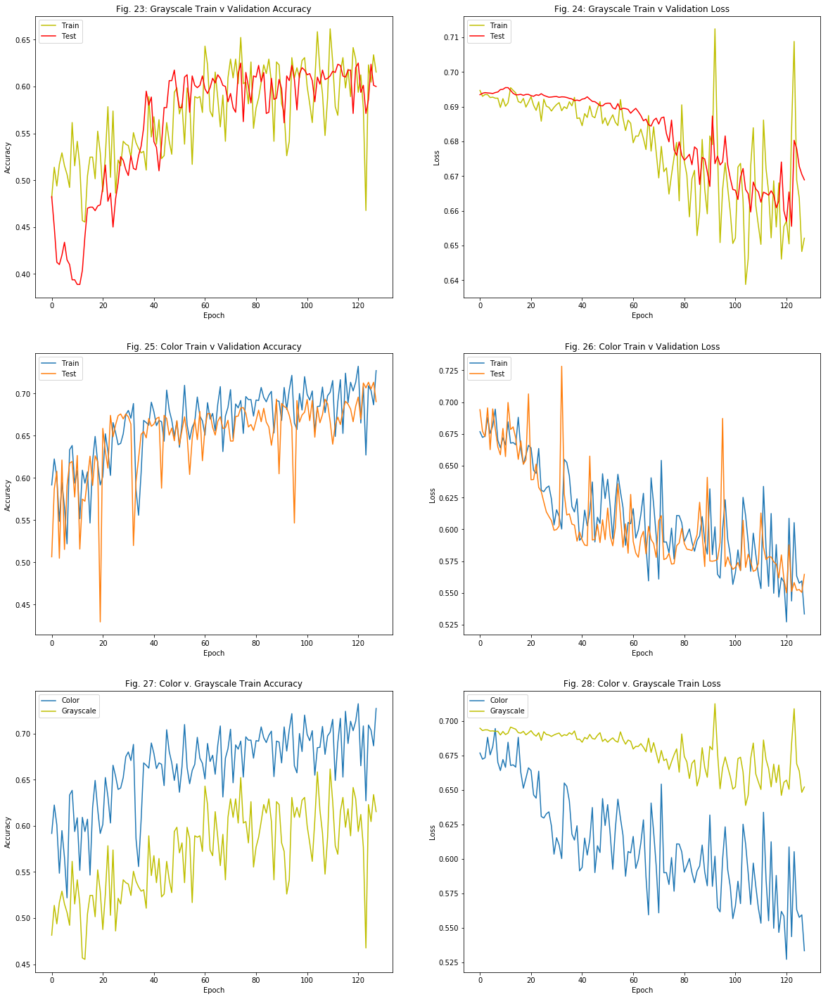

In [460]:
plt.figure(figsize = (20, 25))

plt.subplot(3, 2, 1)
plt.plot(history_re_ex_all_gray.history['acc'], 'y-')
plt.plot(history_re_ex_all_gray.history['val_acc'], 'r-')
plt.title('Fig. 23: Grayscale Train v Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(3, 2, 2)
plt.plot(history_re_ex_all_gray.history['loss'], 'y-')
plt.plot(history_re_ex_all_gray.history['val_loss'], 'r-')
plt.title('Fig. 24: Grayscale Train v Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(3, 2, 3)
plt.plot(history_re_ex_all_color.history['acc'])
plt.plot(history_re_ex_all_color.history['val_acc'])
plt.title('Fig. 25: Color Train v Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(3, 2, 4)
plt.plot(history_re_ex_all_color.history['loss'])
plt.plot(history_re_ex_all_color.history['val_loss'])
plt.title('Fig. 26: Color Train v Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(3, 2, 5)
plt.plot(history_re_ex_all_color.history['acc'])
plt.plot(history_re_ex_all_gray.history['acc'], 'y-')
plt.title('Fig. 27: Color v. Grayscale Train Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Color', 'Grayscale'], loc='upper left')

plt.subplot(3, 2, 6)
plt.plot(history_re_ex_all_color.history['loss'])
plt.plot(history_re_ex_all_gray.history['loss'], 'y-')
plt.title('Fig. 28: Color v. Grayscale Train Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Color', 'Grayscale'], loc='upper left')

plt.show()

**Fig. 27** shows results not unlike that of **Fig. 5** for Test #1, such that there is prominent gap between the color and grayscale training accuracies, yet it's much more severe in this case. Where in **Fig. 5**, the gap regularly jumped between 0.02 and 0.04, here the gap is doubled, regularly ranging from 0.04 to 0.08. Interestingly though, both accuracies seem to have very similar upward trends, despite differing jumps in which grayscale is slightly more severe. Around epoch 80, color converges towards 0.68 and grayscale towards 0.60, with both sticking around those values until the end of training.

Seeing as this test was to predict whether a painting of any genre was Realist or Expressionist, thus not focusing on any particular subject, it makes sense that there's such a large gap between the two training accuracies consistently since focusing on color palettes prominent in the styles as signifiers seems much more important than it would be in Test #1 or #2. 

Looking at **Fig. 28**, the results are quite similar to that of **Fig. 6** in which the two training losses take quite different rates of descent, yet the grayscale scores here present a notably flatter line than that of **Fig. 6**.

In [428]:
cm_re_ex_all_gray, accall_re_ex_all_gray = want_acc_cm(model_re_ex_all_gray, test_gen_re_ex_all_gray)
cm_re_ex_all_color, accall_re_ex_all_color = want_acc_cm(model_re_ex_all_color, test_gen_re_ex_all_color)

dbacc['re_ex_all_color'] = accall_re_ex_all_color
dbacc['re_ex_all_gray'] = accall_re_ex_all_gray

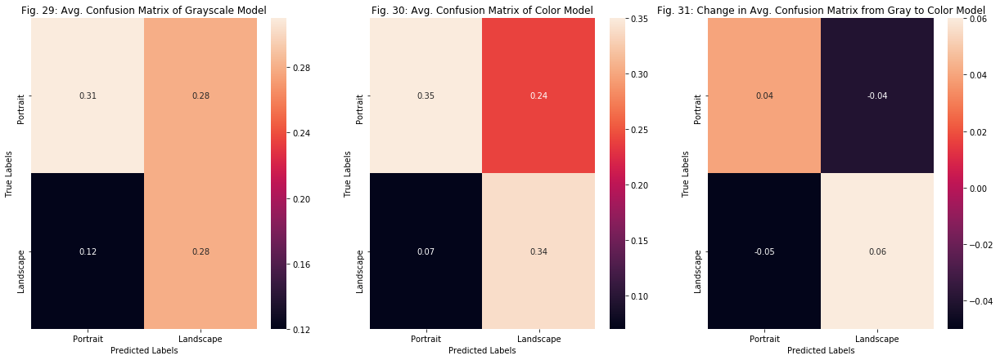

In [426]:
plt.figure(figsize = (21, 7))

ax1 = plt.subplot(1, 3, 1)

sns.heatmap(cm_re_ex_all_gray, annot=True, ax = ax1)

ax1.set_xlabel('Predicted Labels')
ax1.set_ylabel('True Labels')
ax1.set_title('Fig. 29: Avg. Confusion Matrix of Grayscale Model')
ax1.xaxis.set_ticklabels(['Portrait', 'Landscape'])
ax1.yaxis.set_ticklabels(['Portrait', 'Landscape'])

ax2 = plt.subplot(1, 3, 2)
sns.heatmap(cm_re_ex_all_color, annot=True, ax = ax2)

ax2.set_xlabel('Predicted Labels')
ax2.set_ylabel('True Labels')
ax2.set_title('Fig. 30: Avg. Confusion Matrix of Color Model')
ax2.xaxis.set_ticklabels(['Portrait', 'Landscape'])
ax2.yaxis.set_ticklabels(['Portrait', 'Landscape'])

ax3 = plt.subplot(1, 3, 3)
sns.heatmap(cm_re_ex_all_color - cm_re_ex_all_gray, annot=True, ax = ax3)

ax3.set_xlabel('Predicted Labels')
ax3.set_ylabel('True Labels')
ax3.set_title('Fig. 31: Change in Avg. Confusion Matrix from Gray to Color Model')
ax3.xaxis.set_ticklabels(['Portrait', 'Landscape'])
ax3.yaxis.set_ticklabels(['Portrait', 'Landscape'])
plt.show()

In **Fig. 31**, we see the least severe change values presented across all three tests, which is fascinating considering how severe the differences we saw present in **Fig. 27** were. However, in this confusion matrix change, we're seeing an entirely new and unique result that wasn't present in Test #1 or #2: Both of the values for predicted labels equaling true labels are positive, indicating that in this test, switching from grayscale to color images brought about an entirely positive change in which higher overall accuracy wasn't obtained by trading off accuracy in one class for another. 

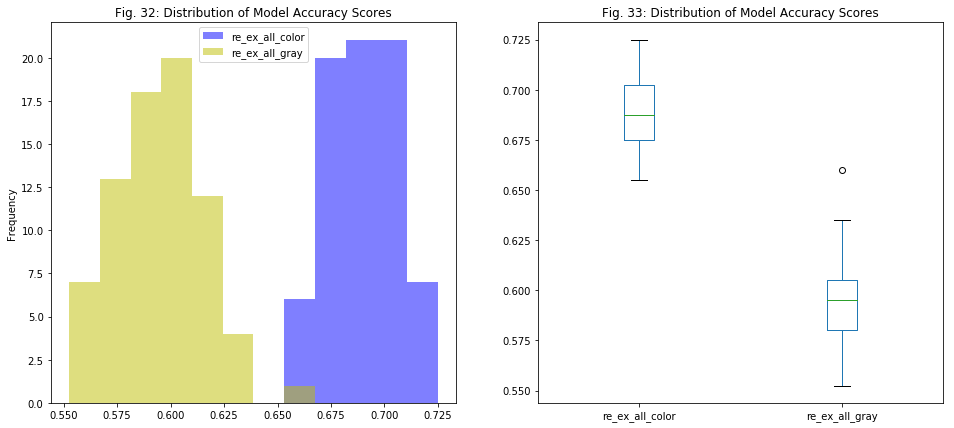

In [458]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 7))
dbacc[['re_ex_all_color', 're_ex_all_gray']].plot.hist(bins = 12, alpha = 0.5, ax = ax1, 
                                title =  'Fig. 32: Distribution of Model Accuracy Scores', 
                                color = ['b', 'y'])
dbacc[['re_ex_all_color', 're_ex_all_gray']].plot.box(ax = ax2, 
                                title =  'Fig. 33: Distribution of Model Accuracy Scores')
plt.show()

Following on the trend of unique observations in this test, **Fig. 32** presents us with two distributions in which, save for an outlier, aren't overlapping at all, or even connected in the sense of there being no bin between the single grayscale outlier and the rest of the grayscale distribution. This is partially due to the grayscale distribution being centered on 0.59 and color on 0.59, but also due to both distributions having tight, normal-looking spreads, with grayscale having a slightly larger range. 

Everything deciphered from **Fig. 32** is very much mirrored in **Fig. 33**. Besides the single grayscale outlier, the boxplots themselves don't overlap in their ranges. The grayscale boxplot has a smaller interquartile range than the color boxplot, yet the color boxplot has a smaller range overall.

In [435]:
temp = pd.DataFrame()
temp = pd.DataFrame([['Realism', 'Expressionism'], 
                     ['All', 'All'], 
                     ['RGB', 'Grayscale']],
                        index = ['Style', 'Genre', 'Shading'], 
                        columns = ['re_ex_all_color', 're_ex_all_gray'])

temp = temp.append(dbacc[['re_ex_all_color', 're_ex_all_gray']].describe())
temp = temp.append(pd.DataFrame([[time_re_ex_all_color, time_re_ex_all_gray]], 
                                        index = ['time'],
                                       columns = temp.columns))
temp['--'] = ""
temp = temp[['--', 're_ex_all_color', 're_ex_all_gray']]

modstats = pd.concat([modstats, temp], axis = 1)
modstats.iloc[:, 6:]

,re_ex_all_color,re_ex_all_gray
Style,Realism,Expressionism
Genre,All,All
Shading,RGB,Grayscale
count,75,75
mean,0.689167,0.594167
std,0.0173854,0.0203323
min,0.655,0.5525
25%,0.675,0.58
50%,0.6875,0.595
75%,0.7025,0.605


From the chart above, we can see that the color model's values for all quartiles ranges from 0.08 to 0.105 higher than that of the grayscale model's values.

Additionally, the color model holds a significantly higher mean that the grayscale model does, at nearly 10% larger, while the grayscale model holds a slightly larger standard deviation.

In [438]:
ptest(dbacc.iloc[:, 4].values, dbacc.iloc[:, 5].values)

Null Hypothesis: There is no significant difference between the two model accuracy samples (p-value > 0.05).

Alternative Hypothesis: There is a significant difference between the two model accuracy samples (p-value < 0.05).

p-value: 3.6705637444182585e-66
We reject the null hypothesis.


Now that we can see our p-value for this test is exponentially smaller than our previous p-values which were both essentially zero, we can say with certainty that this one is also essentially zero, and thus, there is a significant difference in the accuracy of a model predicting whether a painting, regardless of genre, is Realist or Expressionist based on if it's training on grayscale or full color images.

# Conclusion

As a brief recap, the intent of this project was to investigate just how significant or insignificant color is when working with and training deep-learning models for image classification via paintings and using/controlling their respective styles and genres as classes.

Across all three tests, it was made quite apparent that training deep-learning models on images formatted as three RGB arrays leads to a statistically significantly higher mean accuracy in prediction than when training the same model on images formatted as a single grayscale array. This difference in mean accuracies can range from 2% to 10%, as shown across the tests, and is largely dependent upon what variables you may be kept consistent across all training samples, regardless of classes, in conjunction with how subtle the differences may be between classes. The combination of results from all three tests, such as the visualizations, confusion matrices, and p-tests, all provided essential evidence in coming to this deduction.

While the model itself wasn't the focus of the project, I'd like to say that I'm incredibly happy with how well it functioned in image classification across all tests. This is not simply due to seeing it perform well in particularly tricky recognition tasks, but also since I went into this project with zero experience working with deep-learning models, let alone actually building them. Thus, this project is a result of two months of on-and-off self-teaching of Keras via multiple free online resources that allowed me to understand the basic concepts that make up Convolutional Neural Networks and how each different type of layer works and interacts with each other. As such, after a good five or so weeks of attempting to alter the model paramater by parameter and layer by layer after going through countless articles and StackOverflow posts to fix a constant onslaught of underfitting and overfitting problems (the key to my salvation was learning about the optimizer 'momentum' parameter), ending up with such positive results for this project has greatly aided in cementing my passion and interest in pursuing and studying machine learning. 

Future additions I'd like to make to this project would be heavily oriented towards the model itself and towards the classes. Once I study Keras more and become further acquainted with it, I'd like to come back to this project to see if I could make the model even more accurate overall, by at least 5% across all tests if possible for both grayscale and color training. I'd also like to try running this project using different neural network libraries to see if the results I ended with here are consistent across other libraries. For the classes, I'd like to run this project again with the same model, but using different styles and genres for the sake of strengthening my results. Additionally, I'm also interested in working with more than two classes at a time.